# Image Classification Decoded

## 1. Business Problem

### 1.1 Description

The RVL-CDIP (Ryerson Vision Lab Complex Document Information Processing) dataset consists of 400,000 grayscale images in 16 classes, with 25,000 images per class. There are 320,000 training images, 40,000 validation images, and 40,000 test images. The images are sized so their largest dimension does not exceed 1000 pixels.

Here are the classes in the dataset, and an example from each:

![title](Banner.png)

Source : http://www.cs.cmu.edu/~aharley/rvl-cdip/

A. W. Harley, A. Ufkes, K. G. Derpanis, "Evaluation of Deep Convolutional Nets for Document Image Classification and Retrieval," in ICDAR, 2015

### 1.2 Problem Statemtent

Detection of different types of Document images and classify them in different classes like letter, form, email, handwritten, advertisement, scientific report, scientific publication, specification, file folder, news article, budget, invoice, presentation, questionnaire, resume, memo. So It is a Multiclass Classification Problem or we can call it a Computer Vision task.

### 1.3 Data Description

The label files list the images and their categories in the following format:

path/to/the/image.tif category
where the categories are numbered 0 to 15, in the following order:

    0.letter                                    1.form                                      2.email                            3.handwritten                               4.advertisement                             5.scientific report                6.scientific publication                    7.specification                             8.file folder
    9.news article                              10.budget                                   11.invoice
    12.presentation                             13.questionnaire                            14.resume
    15.memo

### 1.4 Usage

This dataset is a subset of the IIT-CDIP Test Collection 1.0 [1], which is publicly available here. The file structure of this dataset is the same as in the IIT collection, so it is possible to refer to that dataset for OCR and additional metadata. The IIT-CDIP dataset is itself a subset of the Legacy Tobacco Document Library [2].

### 1.5 Real-world/Business objectives and constraints

1. The cost of a mis-classification can be high.
2. No strict latency concerns.
3. Computationally Expensive

### **Importing** **Libraries**

In [0]:
import os
import csv
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import cv2
import time
import warnings
from scipy import sparse
import scipy.stats as ss
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec 
import seaborn as sns
from wordcloud import WordCloud ,STOPWORDS
from PIL import Image
import string
import re
import nltk
from nltk.corpus import stopwords
import spacy
from nltk import pos_tag
import warnings
warnings.filterwarnings("ignore")
from glob import glob
from tqdm import tqdm
from keras.layers.normalization import BatchNormalization
from keras.layers import Dropout
from keras.initializers import RandomNormal
import PIL
import cv2
from keras.callbacks import ReduceLROnPlateau
from keras.utils import np_utils
from keras.preprocessing import image
from sklearn.datasets import load_files
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from keras.models import Sequential
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Input, Dense, Flatten, concatenate
from keras.models import Model
from keras.applications.vgg16 import decode_predictions
from keras import optimizers
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tokenize import TweetTokenizer   
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, HashingVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_is_fitted
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from wordcloud import WordCloud,STOPWORDS
import time
import warnings
warnings.filterwarnings("ignore")
from glob import glob
from tqdm import tqdm
import PIL
import cv2
from keras.utils import np_utils
from keras.preprocessing import image
from sklearn.datasets import load_files
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from keras.models import Sequential
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.applications.vgg16 import decode_predictions
from keras import optimizers
from tensorboardcolab import *
import tensorflow as tf
from keras.layers import GlobalAveragePooling2D
import joblib
from keras.backend import set_session
from keras import backend as K
from keras.models import Sequential
from keras.layers import Input, Dropout, Flatten, Conv2D, MaxPooling2D, Dense, Activation
from keras.optimizers import RMSprop
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.optimizers import Adam
from keras.utils import np_utils
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Dropout, Flatten, Conv2D, MaxPooling2D, Dense, Activation
from keras.optimizers import RMSprop
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

Using TensorFlow backend.


### Mounting Google Drive

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


### Downloading the RVL-CDIP Dataset

In [0]:
!curl 'https://doc-10-b4-docs.googleusercontent.com/docs/securesc/phje98qeour5bfeeutelm52umf19cam9/aud09ia921tmfl3vebur76gg2ds3guib/1573603200000/18137660436632322230/11262392864536255567/0Bz1dfcnrpXM-MUt4cHNzUEFXcmc?e=download&authuser=0&nonce=v4rpaid61ad12&user=11262392864536255567&hash=qep8ar5jj2lth0e1to1kceo0fl2r25dq' -H 'authority: doc-10-b4-docs.googleusercontent.com' -H 'upgrade-insecure-requests: 1' -H 'user-agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/78.0.3904.97 Safari/537.36' -H 'sec-fetch-user: ?1' -H 'accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3' -H 'x-client-data: CIy2yQEIpbbJAQjEtskBCKmdygEI4qjKAQjLrsoBCM6wygEI5bHKAQj3tMoBGKukygE=' -H 'sec-fetch-site: cross-site' -H 'sec-fetch-mode: navigate' -H 'referer: https://docs.google.com/uc?id=0Bz1dfcnrpXM-MUt4cHNzUEFXcmc&export=download' -H 'accept-encoding: gzip, deflate, br' -H 'accept-language: en-US,en;q=0.9,bn;q=0.8,hi;q=0.7' -H 'cookie: AUTH_iukl6tdo0kmcngldama5k5ht7dpich65_nonce=v4rpaid61ad12' --compressed -o "rvl-cdip.tar.gz" -L

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 36.1G    0 36.1G    0     0  60.8M      0 --:--:--  0:10:07 --:--:-- 54.3M


### Uncompressing the tar.gz file

In [0]:
import shutil
shutil.unpack_archive('/content/rvl-cdip.tar.gz')

In [0]:
labels = open('/content/labels/train.txt', 'r')
labels = labels.read()

In [0]:
import os
classes = {'0': 'letter', '1': 'form', '2': 'email', '3': 'handwritten', '4': 'advertisement', '5': 'scientific report', 
           '6': 'scientific publication', '7': 'specification', '8': 'file folder', '9': 'news article', '10': 'budget', 
           '11': 'invoice', '12': 'presentation', '13': 'questionnaire', '14': 'resume', '15': 'memo'}

root_path = '/content/images/images'

def make_doc_dirs(path):
    for label in classes.values():
        if not os.path.exists(path + str(label)):
            os.mkdir(path + str(label))

make_doc_dirs('/content/DocImages/training/')
make_doc_dirs('/content/DocImages/testing/')
make_doc_dirs('/content/DocImages/validation/')

In [0]:
labels_split = labels.split('images')
full_paths = []
for image_label in labels_split:
    label = root_path + image_label
    full_paths.append(label)

In [0]:
print(len(full_paths))
print(full_paths[0:10])

320001
['/content/images/images', '/content/images/imagesq/q/o/c/qoc54c00/80035521.tif 15\n', '/content/images/imagese/e/w/c/ewc23d00/513280028.tif 1\n', '/content/images/imagesw/w/b/t/wbt26e00/2053453161.tif 7\n', '/content/images/imagesm/m/k/m/mkm05e00/2040792992_2040792994.tif 10\n', '/content/images/imageso/o/e/x/oex80d00/522787731+-7732.tif 3\n', '/content/images/imagesq/q/v/t/qvt06d00/50525666-5667.tif 14\n', '/content/images/imagesr/r/l/z/rlz20d00/521107137+-7140.tif 11\n', '/content/images/imagesk/k/n/i/kni98c00/87538356_8359.tif 13\n', '/content/images/imagesm/m/q/v/mqv03f00/0011846871.tif 0\n']


In [0]:
full_paths = full_paths[1:]
paths = []
for path in full_paths:
    path = path.split('\n')
    for p in path:
        p = p.rsplit(' ',1)
        paths.append(p)
        
paths = [x for x in paths if x != ['']]  
print(len(paths))
print(paths[:5])

320000
[['/content/images/imagesq/q/o/c/qoc54c00/80035521.tif', '15'], ['/content/images/imagese/e/w/c/ewc23d00/513280028.tif', '1'], ['/content/images/imagesw/w/b/t/wbt26e00/2053453161.tif', '7'], ['/content/images/imagesm/m/k/m/mkm05e00/2040792992_2040792994.tif', '10'], ['/content/images/imageso/o/e/x/oex80d00/522787731+-7732.tif', '3']]


In [0]:
i = 0
for p in paths[:320000]:
    old_path = p[0]
    full_path = p[0].split('images/')
    doctype = p[1]
    for key, value in classes.items():
        if doctype == key:
            doctype = value
    root_path = full_path[0]
    image_filename = full_path[1].rsplit('/', 1)[1]
    new_path = root_path +'DocImages/training/'+str(doctype) + '/' + image_filename   

    if not os.path.exists(new_path):
        os.rename(old_path, new_path)
        i += 1
        if i % 1000 == 0:
            print(str(i) + "/320000")
            print(old_path)
            print(new_path)

1000/320000
/content/images/imagesk/k/n/i/kni87c00/506818313+-8313.tif
/content/DocImages/training/handwritten/506818313+-8313.tif
2000/320000
/content/images/imagesm/m/a/v/mav71a00/2057467808_2057467811.tif
/content/DocImages/training/specification/2057467808_2057467811.tif
3000/320000
/content/images/imagesh/h/w/r/hwr02e00/2028728622.tif
/content/DocImages/training/invoice/2028728622.tif
4000/320000
/content/images/imagesw/w/h/k/whk16d00/50590758-0759.tif
/content/DocImages/training/resume/50590758-0759.tif
5000/320000
/content/images/imagesk/k/h/b/khb84e00/2061193717.tif
/content/DocImages/training/advertisement/2061193717.tif
6000/320000
/content/images/imagesn/n/k/q/nkq13d00/513614517_513614518.tif
/content/DocImages/training/handwritten/513614517_513614518.tif
7000/320000
/content/images/imagesq/q/t/v/qtv00e00/03011899.tif
/content/DocImages/training/news article/03011899.tif
8000/320000
/content/images/imagesy/y/t/l/ytl65c00/2082867907.tif
/content/DocImages/training/form/208286

In [0]:
labels = open('/content/labels/test.txt', 'r')
labels = labels.read()

In [0]:
import os
classes = {'0': 'letter', '1': 'form', '2': 'email', '3': 'handwritten', '4': 'advertisement', '5': 'scientific report', 
           '6': 'scientific publication', '7': 'specification', '8': 'file folder', '9': 'news article', '10': 'budget', 
           '11': 'invoice', '12': 'presentation', '13': 'questionnaire', '14': 'resume', '15': 'memo'}

root_path = '/content/images/images'

def make_doc_dirs(path):
    for label in classes.values():
        if not os.path.exists(path + str(label)):
            os.mkdir(path + str(label))

make_doc_dirs('/content/DocImages/training/')
make_doc_dirs('/content/DocImages/testing/')
make_doc_dirs('/content/DocImages/validation/')

In [0]:
labels_split = labels.split('images')
full_paths = []
for image_label in labels_split:
    label = root_path + image_label
    full_paths.append(label)

In [0]:
print(len(full_paths))
print(full_paths[0:10])

40001
['/content/images/images', '/content/images/imagesr/r/g/e/rge31d00/503210033+-0034.tif 3\n', '/content/images/imagesc/c/e/j/cej80d00/517306722+-6724.tif 3\n', '/content/images/imagesm/m/r/r/mrr36d00/50603620-3621.tif 14\n', '/content/images/imagesg/g/t/u/gtu29c00/2084573574a.tif 2\n', '/content/images/imagesh/h/o/f/hof08d00/2071783492.tif 9\n', '/content/images/imagesx/x/a/b/xab71f00/1002977593_1002977622.tif 6\n', '/content/images/imageso/o/k/s/oks31f00/0001437969.tif 13\n', '/content/images/imagesj/j/t/o/jto61f00/2050283643.tif 8\n', '/content/images/imagesh/h/j/g/hjg89e00/0000049717.tif 0\n']


In [0]:
full_paths = full_paths[1:]
paths = []
for path in full_paths:
    path = path.split('\n')
    for p in path:
        p = p.rsplit(' ',1)
        paths.append(p)
        
paths = [x for x in paths if x != ['']]  
print(len(paths))
print(paths[:5])

40000
[['/content/images/imagesr/r/g/e/rge31d00/503210033+-0034.tif', '3'], ['/content/images/imagesc/c/e/j/cej80d00/517306722+-6724.tif', '3'], ['/content/images/imagesm/m/r/r/mrr36d00/50603620-3621.tif', '14'], ['/content/images/imagesg/g/t/u/gtu29c00/2084573574a.tif', '2'], ['/content/images/imagesh/h/o/f/hof08d00/2071783492.tif', '9']]


In [0]:
i = 0
for p in paths[:39000]:
    old_path = p[0]
    full_path = p[0].split('images/')
    doctype = p[1]
    for key, value in classes.items():
        if doctype == key:
            doctype = value
    root_path = full_path[0]
    image_filename = full_path[1].rsplit('/', 1)[1]
    new_path = root_path +'DocImages/testing/'+str(doctype) + '/' + image_filename

    if not os.path.exists(new_path):
        os.rename(old_path, new_path)
        i += 1
        if i % 1000 == 0:
            print(str(i) + "/39000")
            print(old_path)
            print(new_path)

1000/39000
/content/images/imagesm/m/d/o/mdo43e00/2024216699.tif
/content/DocImages/testing/file folder/2024216699.tif
2000/39000
/content/images/imagesa/a/b/l/abl24e00/2024961531.tif
/content/DocImages/testing/file folder/2024961531.tif
3000/39000
/content/images/imagesu/u/p/z/upz84c00/93503341.tif
/content/DocImages/testing/budget/93503341.tif
4000/39000
/content/images/imagesm/m/m/e/mme21d00/515944614+-4616.tif
/content/DocImages/testing/handwritten/515944614+-4616.tif
5000/39000
/content/images/imagesp/p/i/c/pic03a00/518599493+-9497.tif
/content/DocImages/testing/form/518599493+-9497.tif
6000/39000
/content/images/imagese/e/y/d/eyd73c00/2065518028_8030.tif
/content/DocImages/testing/news article/2065518028_8030.tif
7000/39000
/content/images/imagesl/l/n/x/lnx01f00/0001254743.tif
/content/DocImages/testing/memo/0001254743.tif
8000/39000
/content/images/imagesn/n/t/m/ntm40f00/0000525355.tif
/content/DocImages/testing/memo/0000525355.tif
9000/39000
/content/images/imagesc/c/p/t/cpt21e

In [0]:
labels = open('/content/labels/val.txt', 'r')
labels = labels.read()

In [0]:
import os
classes = {'0': 'letter', '1': 'form', '2': 'email', '3': 'handwritten', '4': 'advertisement', '5': 'scientific report', 
           '6': 'scientific publication', '7': 'specification', '8': 'file folder', '9': 'news article', '10': 'budget', 
           '11': 'invoice', '12': 'presentation', '13': 'questionnaire', '14': 'resume', '15': 'memo'}

root_path = '/content/images/images'

def make_doc_dirs(path):
    for label in classes.values():
        if not os.path.exists(path + str(label)):
            os.mkdir(path + str(label))

make_doc_dirs('/content/DocImages/training/')
make_doc_dirs('/content/DocImages/testing/')
make_doc_dirs('/content/DocImages/validation/')

In [0]:
labels_split = labels.split('images')
full_paths = []
for image_label in labels_split:
    label = root_path + image_label
    full_paths.append(label)

In [0]:
print(len(full_paths))
print(full_paths[0:10])

40001
['/content/images/images', '/content/images/imagesg/g/t/h/gth35e00/2024525661.tif 11\n', '/content/images/imagesi/i/y/k/iyk38c00/512015827+-5827.tif 0\n', '/content/images/imagesr/r/r/e/rre21e00/87103403.tif 0\n', '/content/images/imagesk/k/s/u/ksu44c00/03636607.tif 4\n', '/content/images/imagesr/r/a/i/rai09d00/50437856-7857.tif 14\n', '/content/images/imagesd/d/q/j/dqj13f00/0000457436.tif 12\n', '/content/images/imagesx/x/o/g/xog20a00/10121367.tif 6\n', '/content/images/imagesh/h/p/z/hpz84c00/93503327.tif 10\n', '/content/images/imagesa/a/h/t/aht78d00/502596897.tif 4\n']


In [0]:
full_paths = full_paths[1:]
paths = []
for path in full_paths:
    path = path.split('\n')
    for p in path:
        p = p.rsplit(' ',1)
        paths.append(p)
        
paths = [x for x in paths if x != ['']]  
print(len(paths))
print(paths[:5])

40000
[['/content/images/imagesg/g/t/h/gth35e00/2024525661.tif', '11'], ['/content/images/imagesi/i/y/k/iyk38c00/512015827+-5827.tif', '0'], ['/content/images/imagesr/r/r/e/rre21e00/87103403.tif', '0'], ['/content/images/imagesk/k/s/u/ksu44c00/03636607.tif', '4'], ['/content/images/imagesr/r/a/i/rai09d00/50437856-7857.tif', '14']]


In [0]:
i = 0
for p in paths[:39000]:
    old_path = p[0]
    full_path = p[0].split('images/')
    doctype = p[1]
    for key, value in classes.items():
        if doctype == key:
            doctype = value
    root_path = full_path[0]
    image_filename = full_path[1].rsplit('/', 1)[1]
    new_path = root_path +'DocImages/validation/'+str(doctype) + '/' + image_filename
    
    if not os.path.exists(new_path):
        os.rename(old_path, new_path)
        i += 1
        if i % 1000 == 0:
            print(str(i) + "/39000")
            print(old_path)
            print(new_path)

1000/39000
/content/images/imagesu/u/o/v/uov22f00/tim01175.99.tif
/content/DocImages/validation/budget/tim01175.99.tif
2000/39000
/content/images/imagese/e/r/c/erc10d00/50365965-5965.tif
/content/DocImages/validation/file folder/50365965-5965.tif
3000/39000
/content/images/imagesx/x/g/o/xgo33e00/2053630098.tif
/content/DocImages/validation/file folder/2053630098.tif
4000/39000
/content/images/imagesa/a/j/v/ajv27e00/2028871490.tif
/content/DocImages/validation/questionnaire/2028871490.tif
5000/39000
/content/images/imagesj/j/a/h/jah72f00/tob09830.73.tif
/content/DocImages/validation/news article/tob09830.73.tif
6000/39000
/content/images/imagesb/b/d/l/bdl37e00/2028953543.tif
/content/DocImages/validation/letter/2028953543.tif
7000/39000
/content/images/imagesc/c/h/d/chd23e00/2058503762.tif
/content/DocImages/validation/advertisement/2058503762.tif
8000/39000
/content/images/imagesl/l/f/r/lfr99c00/40045130-5131.tif
/content/DocImages/validation/resume/40045130-5131.tif
9000/39000
/conten

In [0]:
print(paths[1])

['/content/images/imagesi/i/y/k/iyk38c00/512015827+-5827.tif', '0']


In [0]:
make_doc_dirs('/content/DocumentImages/train/')
make_doc_dirs('/content/DocumentImages/test/')
make_doc_dirs('/content/DocumentImages/valid/')

In [0]:
%%time
path = '/content/DocImages/training/'
roots = []
for root, dirs, files in os.walk(path):
    roots.append(root)
print(roots[1:])

['/content/DocImages/training/email', '/content/DocImages/training/letter', '/content/DocImages/training/resume', '/content/DocImages/training/file folder', '/content/DocImages/training/handwritten', '/content/DocImages/training/scientific publication', '/content/DocImages/training/invoice', '/content/DocImages/training/specification', '/content/DocImages/training/budget', '/content/DocImages/training/scientific report', '/content/DocImages/training/presentation', '/content/DocImages/training/news article', '/content/DocImages/training/questionnaire', '/content/DocImages/training/form', '/content/DocImages/training/memo', '/content/DocImages/training/advertisement']
CPU times: user 244 ms, sys: 115 ms, total: 359 ms
Wall time: 381 ms


In [0]:
%%time
import random
path = '/content/DocImages/training/'
roots = []
for root, dirs, files in os.walk(path):
    roots.append(root)
    
random.seed(29)
i = 1
for root in roots[1:]:
    print("Subsetting images from class {}/16".format(i))
    print(root)
    images = []
    for root, dirs, files in os.walk(root):
        for file in files:
            images.append(str(root)+os.sep+str(file))
    random.shuffle(images)
    images_subset = images[:19500]
    print(len(images_subset))
    for image in images_subset:
        split_im = image.split("DocImages/training")
        os.rename(image, split_im[0]+'DocumentImages/train'+split_im[1])
    i += 1

Subsetting images from class 1/16
/content/DocImages/training/email
19500
Subsetting images from class 2/16
/content/DocImages/training/letter
19500
Subsetting images from class 3/16
/content/DocImages/training/resume
19500
Subsetting images from class 4/16
/content/DocImages/training/file folder
19500
Subsetting images from class 5/16
/content/DocImages/training/handwritten
19500
Subsetting images from class 6/16
/content/DocImages/training/scientific publication
19500
Subsetting images from class 7/16
/content/DocImages/training/invoice
19500
Subsetting images from class 8/16
/content/DocImages/training/specification
19500
Subsetting images from class 9/16
/content/DocImages/training/budget
19500
Subsetting images from class 10/16
/content/DocImages/training/scientific report
19500
Subsetting images from class 11/16
/content/DocImages/training/presentation
19500
Subsetting images from class 12/16
/content/DocImages/training/news article
19500
Subsetting images from class 13/16
/conte

In [0]:
%%time
path = '/content/DocImages/testing/'
roots = []
for root, dirs, files in os.walk(path):
    roots.append(root)
    
random.seed(29)
i = 1
for root in roots[1:]:
    print("Subsetting images from class {}/16".format(i))
    print(root)
    images = []
    for root, dirs, files in os.walk(root):
        for file in files:
            images.append(str(root)+os.sep+str(file))
    random.shuffle(images)
    images_subset = images[:2300]
    print(len(images_subset))
    for image in images_subset:
        split_im = image.split("DocImages/testing")
        os.rename(image, split_im[0]+'DocumentImages/test'+split_im[1])
    i += 1

Subsetting images from class 1/16
/content/DocImages/testing/email
2300
Subsetting images from class 2/16
/content/DocImages/testing/letter
2300
Subsetting images from class 3/16
/content/DocImages/testing/resume
2300
Subsetting images from class 4/16
/content/DocImages/testing/file folder
2300
Subsetting images from class 5/16
/content/DocImages/testing/handwritten
2300
Subsetting images from class 6/16
/content/DocImages/testing/scientific publication
2300
Subsetting images from class 7/16
/content/DocImages/testing/invoice
2300
Subsetting images from class 8/16
/content/DocImages/testing/specification
2300
Subsetting images from class 9/16
/content/DocImages/testing/budget
2300
Subsetting images from class 10/16
/content/DocImages/testing/scientific report
2300
Subsetting images from class 11/16
/content/DocImages/testing/presentation
2300
Subsetting images from class 12/16
/content/DocImages/testing/news article
2300
Subsetting images from class 13/16
/content/DocImages/testing/que

In [0]:
%%time
path = '/content/DocImages/validation/'
roots = []
for root, dirs, files in os.walk(path):
    roots.append(root)
    
random.seed(29)
i = 1
for root in roots[1:]:
    print("Subsetting images from class {}/16".format(i))
    print(root)
    images = []
    for root, dirs, files in os.walk(root):
        for file in files:
            images.append(str(root)+os.sep+str(file))
    random.shuffle(images)
    images_subset = images[:2300]
    print(len(images_subset))
    for image in images_subset:
        split_im = image.split("DocImages/validation")
        os.rename(image, split_im[0]+'DocumentImages/valid'+split_im[1])
    i += 1

Subsetting images from class 1/16
/content/DocImages/validation/email
2300
Subsetting images from class 2/16
/content/DocImages/validation/letter
2300
Subsetting images from class 3/16
/content/DocImages/validation/resume
2300
Subsetting images from class 4/16
/content/DocImages/validation/file folder
2300
Subsetting images from class 5/16
/content/DocImages/validation/handwritten
2300
Subsetting images from class 6/16
/content/DocImages/validation/scientific publication
2300
Subsetting images from class 7/16
/content/DocImages/validation/invoice
2300
Subsetting images from class 8/16
/content/DocImages/validation/specification
2300
Subsetting images from class 9/16
/content/DocImages/validation/budget
2300
Subsetting images from class 10/16
/content/DocImages/validation/scientific report
2300
Subsetting images from class 11/16
/content/DocImages/validation/presentation
2300
Subsetting images from class 12/16
/content/DocImages/validation/news article
2300
Subsetting images from class 

In [0]:
# Extract all image paths
def extract_file_paths(path):
    image_filenames = []
    for root, dirs, files in os.walk(path):
        if len(files) > 0:
            for file in files:
                if(file[-3:] == "tif" or file[-3:] == "Tif"):
                    image_filenames.append(str(root)+os.sep+str(file))
    print(len(image_filenames))
    return image_filenames

312000
scientific report
/content/DocumentImages/train/scientific report/2058086644_2058086726.tif


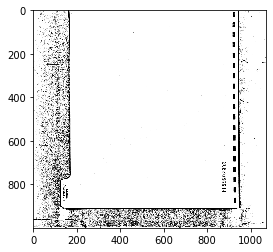

scientific report
/content/DocumentImages/train/scientific report/2058083372.tif


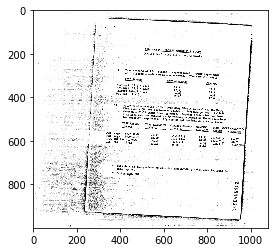

scientific report
/content/DocumentImages/train/scientific report/2058087237_2058087320.tif


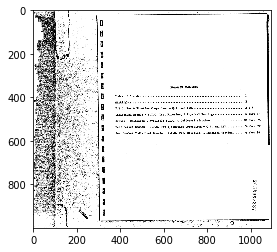

scientific report
/content/DocumentImages/train/scientific report/2058085273_2058085278.tif


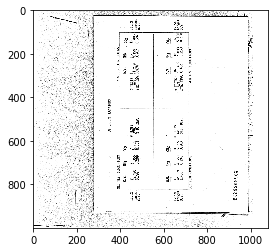

scientific report
/content/DocumentImages/train/scientific report/2058088527_2058088530.tif


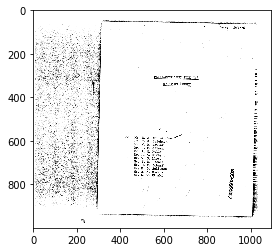

scientific report
/content/DocumentImages/train/scientific report/2058009564.tif


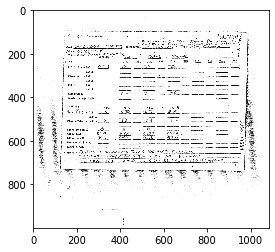

scientific report
/content/DocumentImages/train/scientific report/2058088570.tif


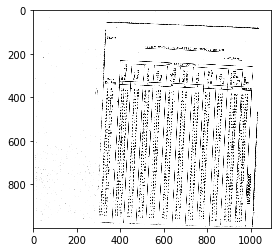

scientific report
/content/DocumentImages/train/scientific report/2058011975_2058011981.tif


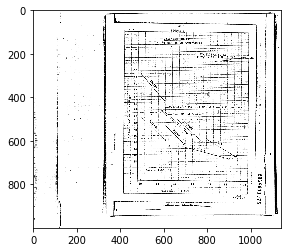

scientific report
/content/DocumentImages/train/scientific report/2058083882_2058083883.tif


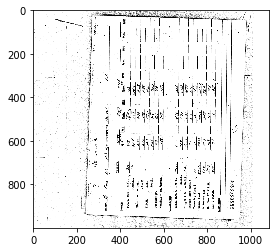

scientific report
/content/DocumentImages/train/scientific report/2058083963.tif


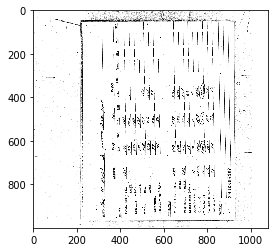

scientific report
/content/DocumentImages/train/scientific report/2058088382_2058088386.tif


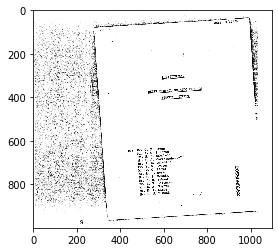

scientific report
/content/DocumentImages/train/scientific report/2058088712.tif


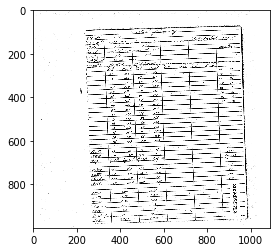

scientific report
/content/DocumentImages/train/scientific report/2058083626.tif


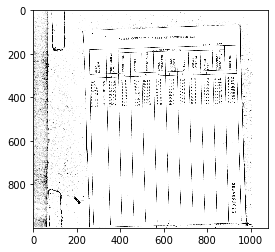

scientific report
/content/DocumentImages/train/scientific report/2058087650.tif


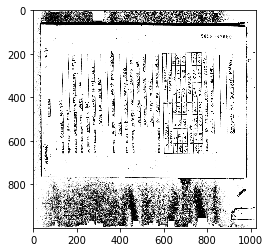

scientific report
/content/DocumentImages/train/scientific report/2058083833.tif


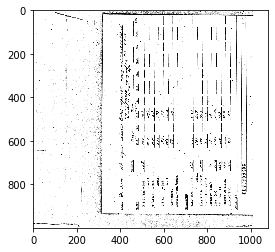

scientific report
/content/DocumentImages/train/scientific report/2058015476.tif


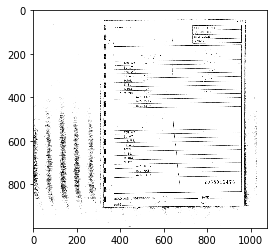

scientific report
/content/DocumentImages/train/scientific report/2058088165_2058088166.tif


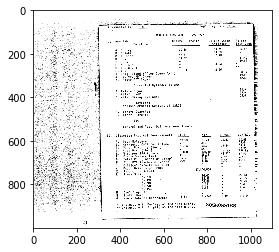

scientific report
/content/DocumentImages/train/scientific report/2058083841_2058083842.tif


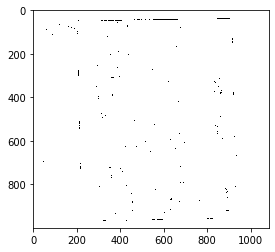

scientific report
/content/DocumentImages/train/scientific report/2058008087_2058008088.tif


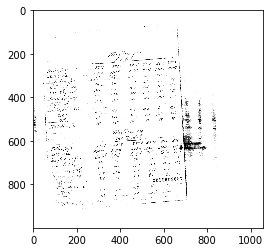

scientific report
/content/DocumentImages/train/scientific report/2058089436_2058089437.tif


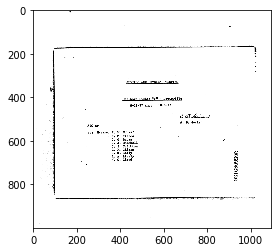

scientific report
/content/DocumentImages/train/scientific report/2058083654.tif


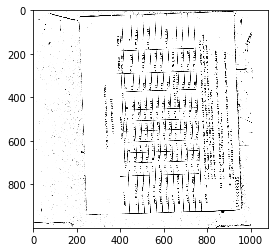

scientific report
/content/DocumentImages/train/scientific report/2058016380_2058016384.tif


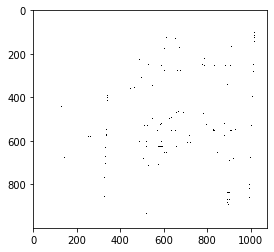

scientific report
/content/DocumentImages/train/scientific report/2058015535.tif


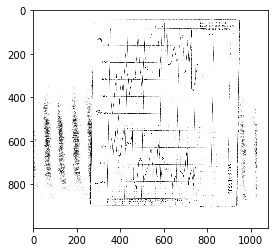

scientific report
/content/DocumentImages/train/scientific report/2058088026.tif


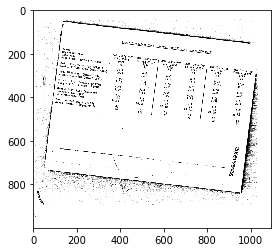

scientific report
/content/DocumentImages/train/scientific report/2058083929.tif


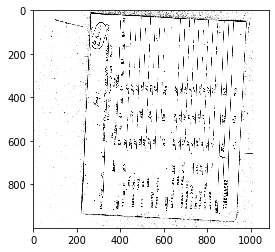

scientific report
/content/DocumentImages/train/scientific report/2058010470_2058010471.tif


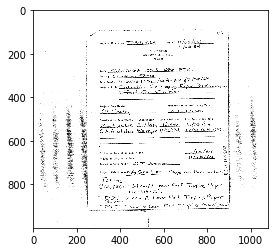

scientific report
/content/DocumentImages/train/scientific report/2058083949_2058083950.tif


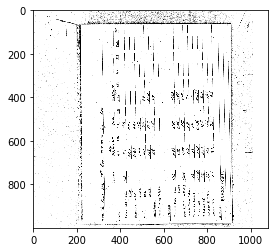

scientific report
/content/DocumentImages/train/scientific report/2058083409_2058083412.tif


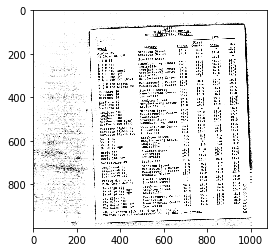

scientific report
/content/DocumentImages/train/scientific report/2058083943.tif


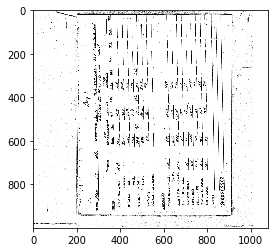

scientific report
/content/DocumentImages/train/scientific report/2058088958.tif


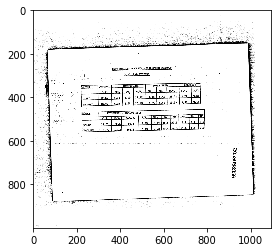

scientific report
/content/DocumentImages/train/scientific report/2058088387_2058088391.tif


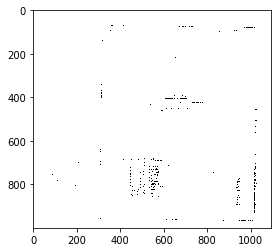

presentation
/content/DocumentImages/train/presentation/0013404138.tif


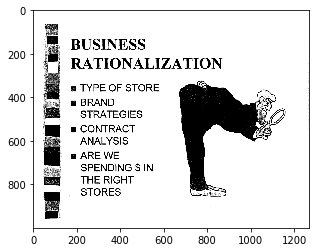

memo
/content/DocumentImages/train/memo/2058088060.tif


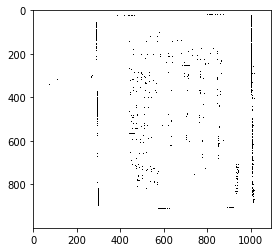

memo
/content/DocumentImages/train/memo/2058008434_2058008447.tif


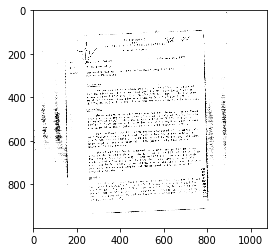

memo
/content/DocumentImages/train/memo/2058008311.tif


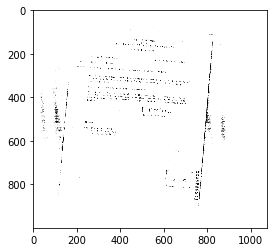

memo
/content/DocumentImages/train/memo/2058089267.tif


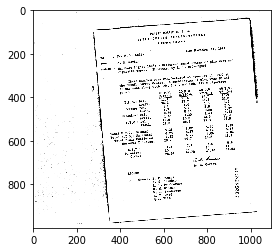

memo
/content/DocumentImages/train/memo/2058015468.tif


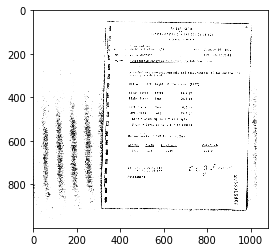

memo
/content/DocumentImages/train/memo/2058083637.tif


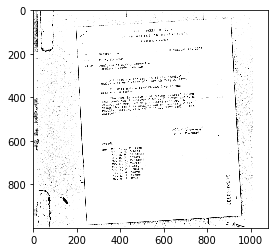

memo
/content/DocumentImages/train/memo/2058088299.tif


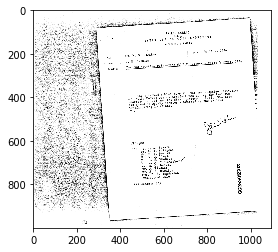

memo
/content/DocumentImages/train/memo/50072044.tif


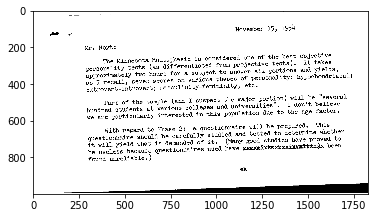

memo
/content/DocumentImages/train/memo/2058015783.tif


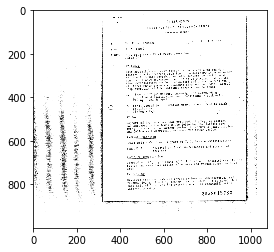

memo
/content/DocumentImages/train/memo/2058088795.tif


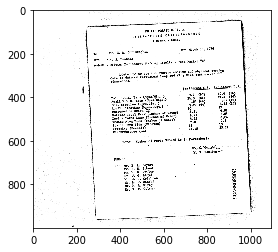

memo
/content/DocumentImages/train/memo/2058008391.tif


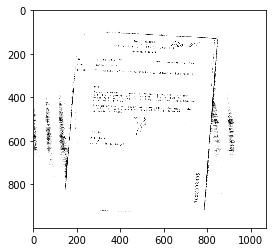

letter
/content/DocumentImages/train/letter/500853668.tif


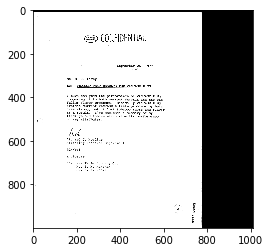

letter
/content/DocumentImages/train/letter/500858976.tif


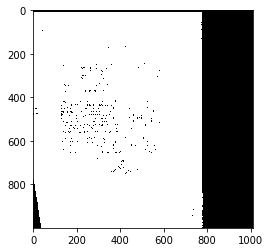

letter
/content/DocumentImages/train/letter/0013248032.tif


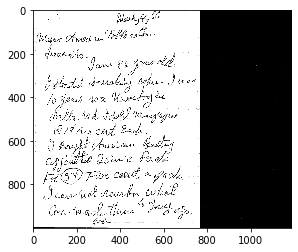

letter
/content/DocumentImages/train/letter/500858906.tif


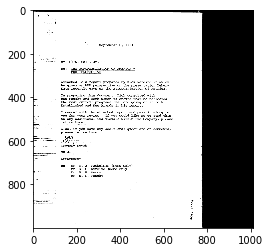

letter
/content/DocumentImages/train/letter/507417099_507417100.tif


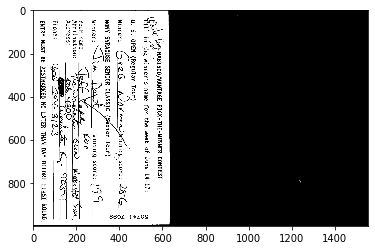

letter
/content/DocumentImages/train/letter/500768535_500768536.tif


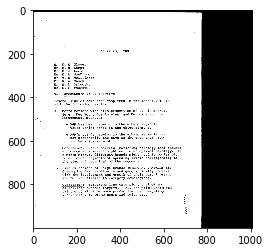

letter
/content/DocumentImages/train/letter/50125639-5639.tif


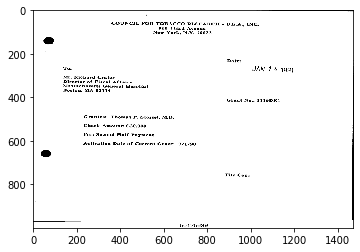

invoice
/content/DocumentImages/train/invoice/70117809-7809.tif


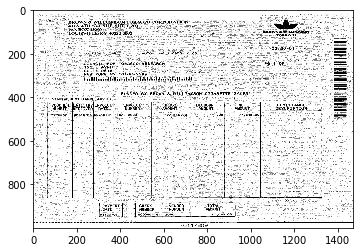

invoice
/content/DocumentImages/train/invoice/70117823-7823.tif


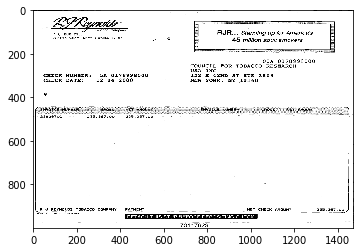

invoice
/content/DocumentImages/train/invoice/2040879785.tif


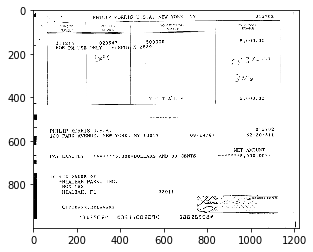

invoice
/content/DocumentImages/train/invoice/70117853-7853.tif


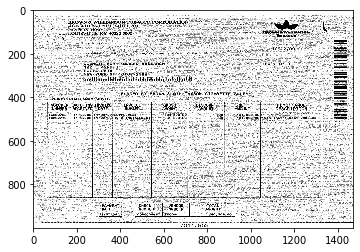

invoice
/content/DocumentImages/train/invoice/2040879786.tif


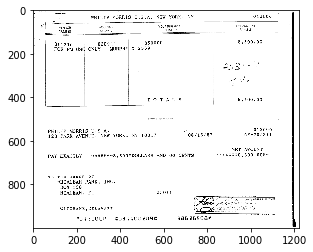

form
/content/DocumentImages/train/form/0030041076.tif


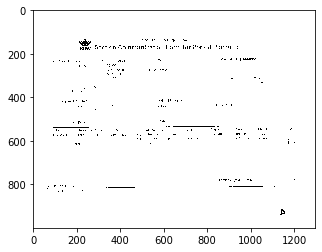

form
/content/DocumentImages/train/form/2058003688.tif


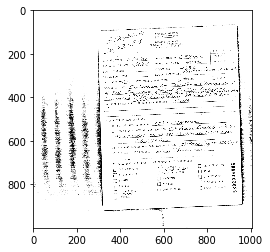

form
/content/DocumentImages/train/form/2058010373_2058010381.tif


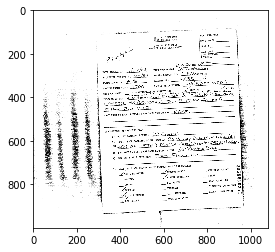

form
/content/DocumentImages/train/form/2058003961.tif


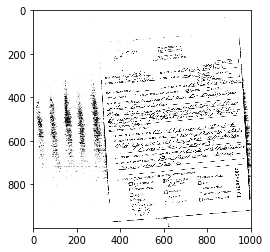

form
/content/DocumentImages/train/form/2058012537_2058012539.tif


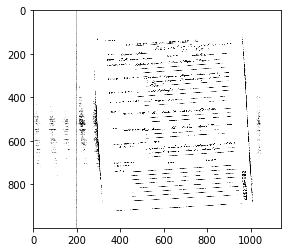

form
/content/DocumentImages/train/form/507417159_507417160.tif


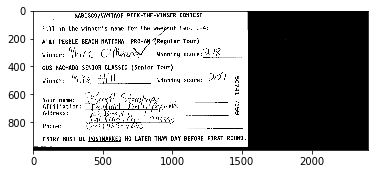

form
/content/DocumentImages/train/form/507417198_507417199.tif


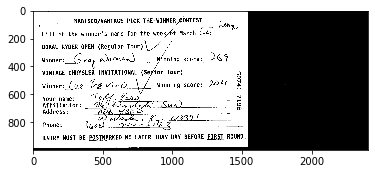

form
/content/DocumentImages/train/form/0030041180.tif


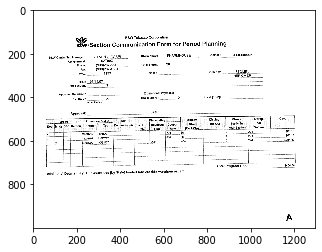

form
/content/DocumentImages/train/form/2058003673.tif


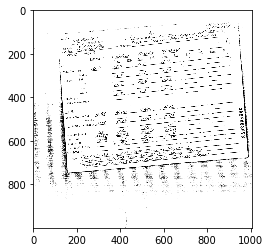

form
/content/DocumentImages/train/form/0030041222.tif


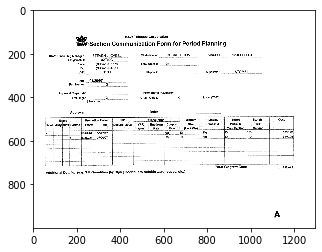

form
/content/DocumentImages/train/form/0030030842.tif


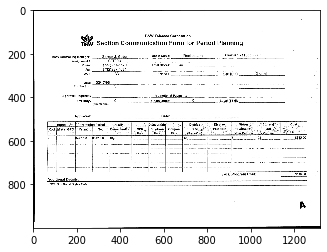

form
/content/DocumentImages/train/form/2058033198.tif


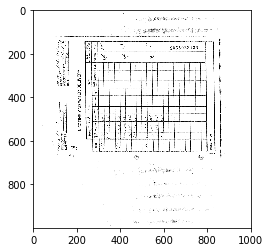

form
/content/DocumentImages/train/form/2056975669.tif


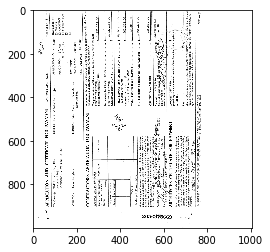

form
/content/DocumentImages/train/form/0030041221.tif


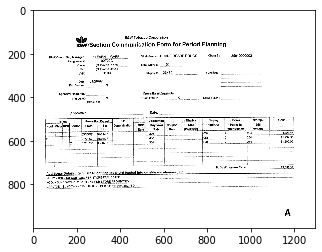

form
/content/DocumentImages/train/form/0030041244.tif


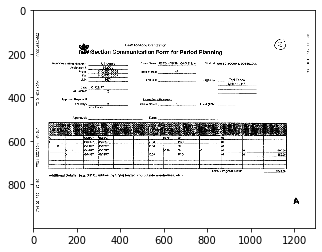

form
/content/DocumentImages/train/form/2058003689_2058003690.tif


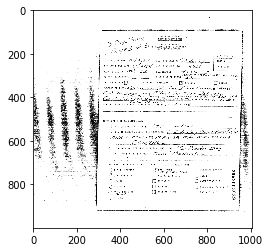

form
/content/DocumentImages/train/form/2058003598.tif


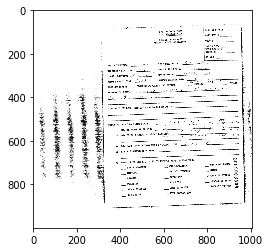

form
/content/DocumentImages/train/form/2058032800.tif


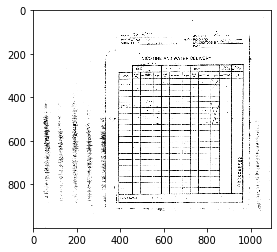

form
/content/DocumentImages/train/form/2058003684_2058003685.tif


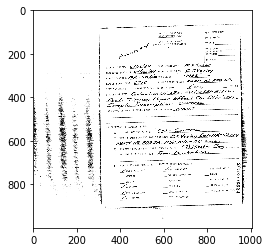

form
/content/DocumentImages/train/form/0030041089.tif


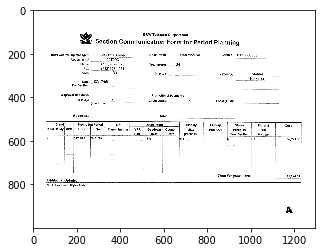

form
/content/DocumentImages/train/form/2058003922.tif


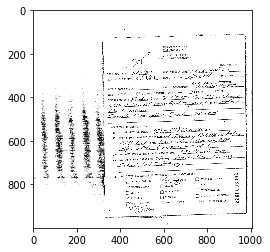

form
/content/DocumentImages/train/form/0030030844.tif


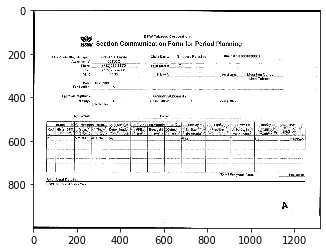

scientific publication
/content/DocumentImages/train/scientific publication/1000080993_1000080996.tif


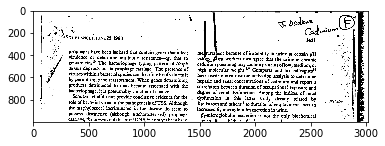

specification
/content/DocumentImages/train/specification/2058088177_2058088178.tif


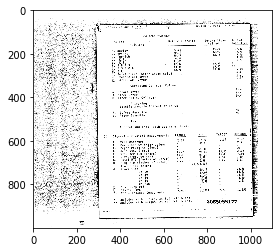

specification
/content/DocumentImages/train/specification/2058089487.tif


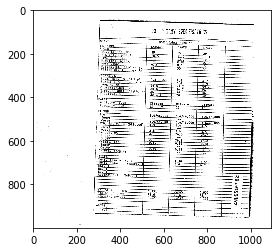

specification
/content/DocumentImages/train/specification/2058008190.tif


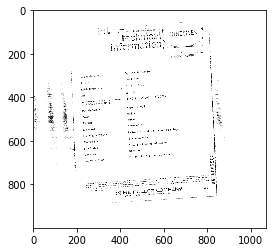

specification
/content/DocumentImages/train/specification/2058008194.tif


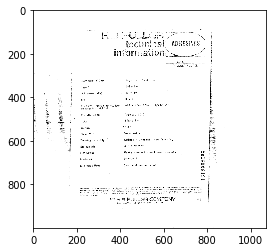

specification
/content/DocumentImages/train/specification/2058096006.tif


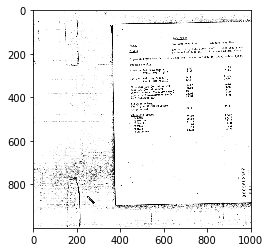

file folder
/content/DocumentImages/train/file folder/2057996603.tif


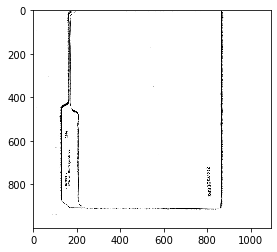

file folder
/content/DocumentImages/train/file folder/2058086812.tif


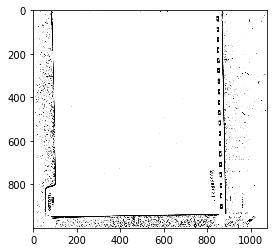

file folder
/content/DocumentImages/train/file folder/2061986255.tif


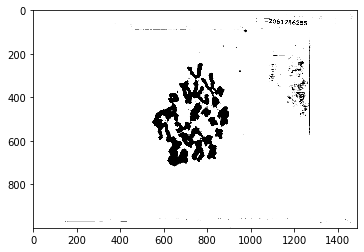

news article
/content/DocumentImages/train/news article/2042824722.tif


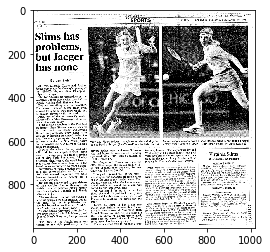

news article
/content/DocumentImages/train/news article/2501205110.tif


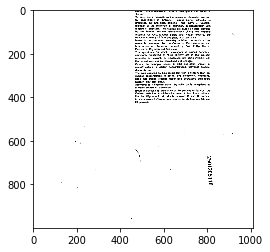

news article
/content/DocumentImages/train/news article/1003042957.tif


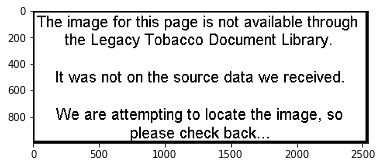

advertisement
/content/DocumentImages/train/advertisement/2061002423.tif


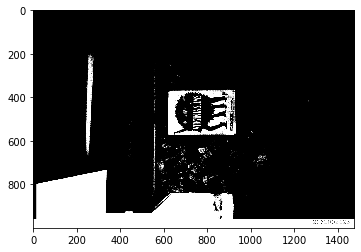

advertisement
/content/DocumentImages/train/advertisement/502610793+-0793.tif


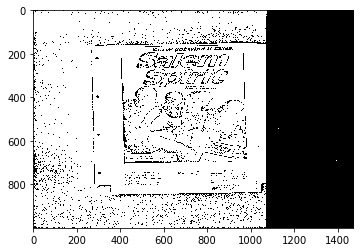

advertisement
/content/DocumentImages/train/advertisement/502606631+-6631.tif


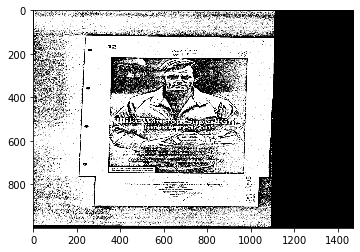

advertisement
/content/DocumentImages/train/advertisement/502605775+-5775.tif


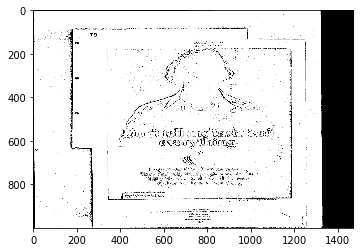

advertisement
/content/DocumentImages/train/advertisement/502610823+-0823.tif


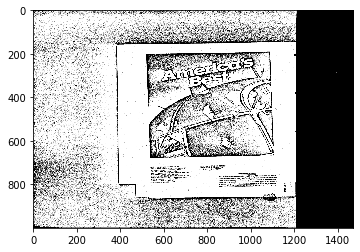

advertisement
/content/DocumentImages/train/advertisement/2061003307.tif


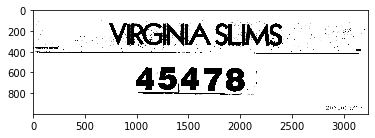

advertisement
/content/DocumentImages/train/advertisement/502605734+-5734.tif


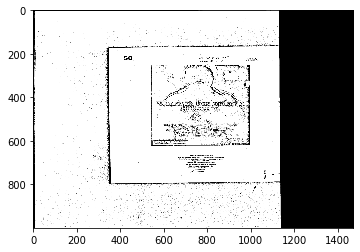

advertisement
/content/DocumentImages/train/advertisement/502605692+-5692.tif


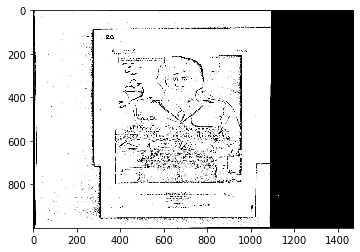

advertisement
/content/DocumentImages/train/advertisement/502610513+-0516.tif


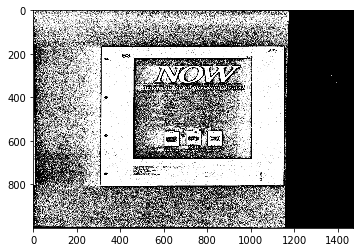

advertisement
/content/DocumentImages/train/advertisement/502606688+-6688.tif


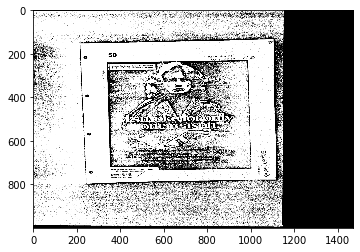

advertisement
/content/DocumentImages/train/advertisement/502610509+-0510.tif


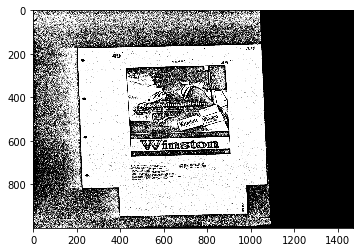

advertisement
/content/DocumentImages/train/advertisement/0071087562.tif


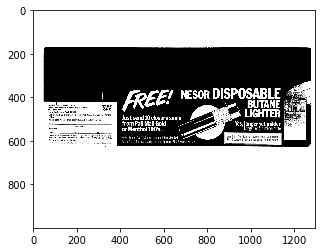

advertisement
/content/DocumentImages/train/advertisement/507806534.tif


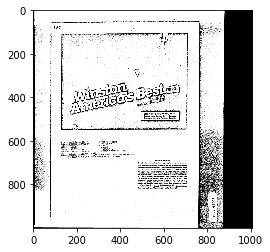

advertisement
/content/DocumentImages/train/advertisement/502100393+-0393.tif


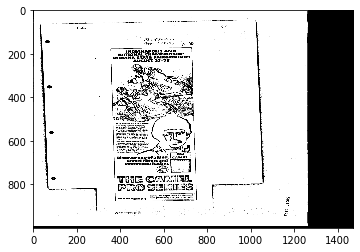

advertisement
/content/DocumentImages/train/advertisement/502605717+-5717.tif


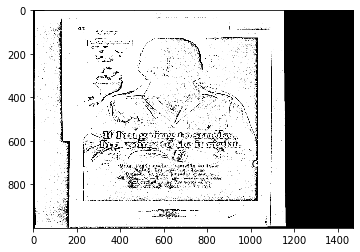

advertisement
/content/DocumentImages/train/advertisement/502100635+-0635.tif


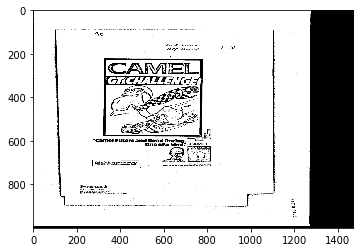

advertisement
/content/DocumentImages/train/advertisement/503961314+-1314.tif


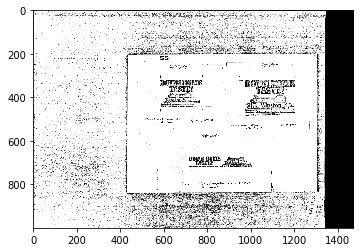

advertisement
/content/DocumentImages/train/advertisement/2058504140.tif


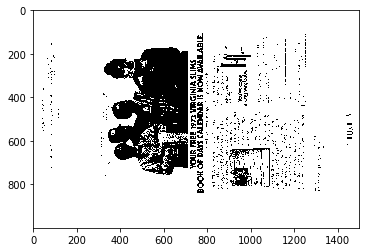

advertisement
/content/DocumentImages/train/advertisement/502100590+-0590.tif


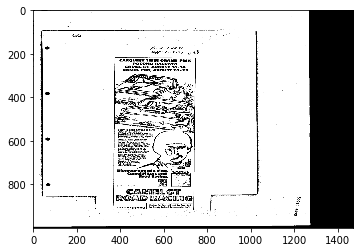

advertisement
/content/DocumentImages/train/advertisement/502100510+-0510.tif


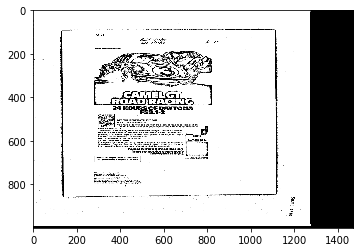

advertisement
/content/DocumentImages/train/advertisement/2061002598.tif


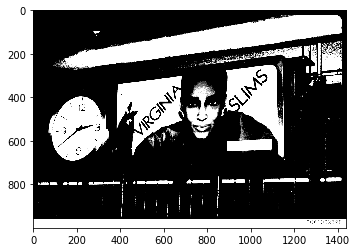

advertisement
/content/DocumentImages/train/advertisement/502474085.tif


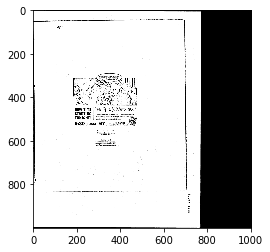

advertisement
/content/DocumentImages/train/advertisement/502606719+-6719.tif


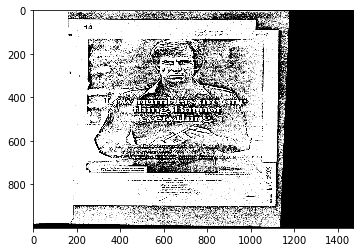

advertisement
/content/DocumentImages/train/advertisement/2061000285.tif


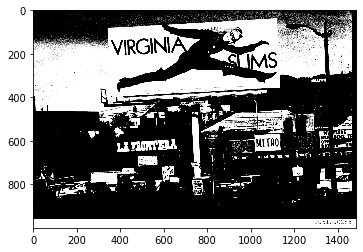

advertisement
/content/DocumentImages/train/advertisement/501947887.tif


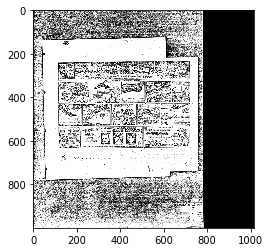

advertisement
/content/DocumentImages/train/advertisement/503961297+-1297.tif


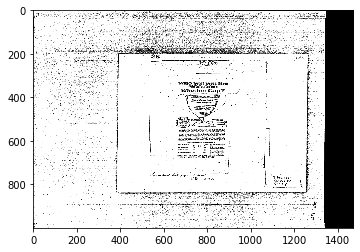

advertisement
/content/DocumentImages/train/advertisement/502100627+-0627.tif


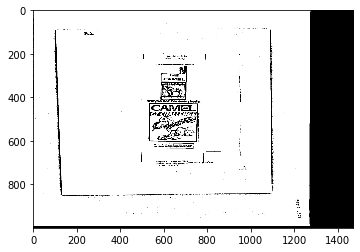

advertisement
/content/DocumentImages/train/advertisement/501947860.tif


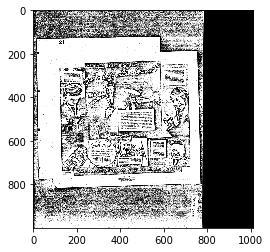

advertisement
/content/DocumentImages/train/advertisement/2061002405.tif


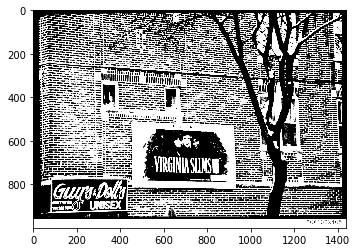

advertisement
/content/DocumentImages/train/advertisement/502605833+-5833.tif


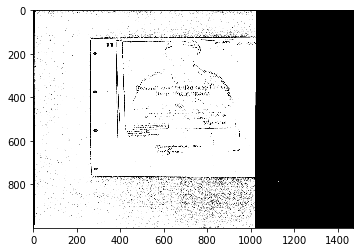

advertisement
/content/DocumentImages/train/advertisement/0030001056.tif


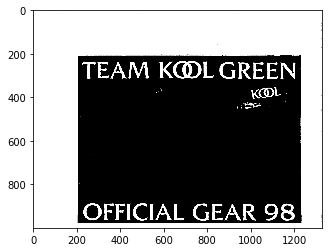

advertisement
/content/DocumentImages/train/advertisement/502605779+-5779.tif


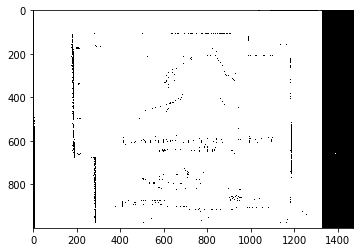

advertisement
/content/DocumentImages/train/advertisement/502605781+-5781.tif


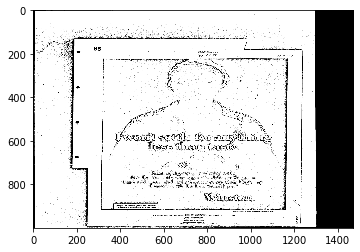

advertisement
/content/DocumentImages/train/advertisement/501947869.tif


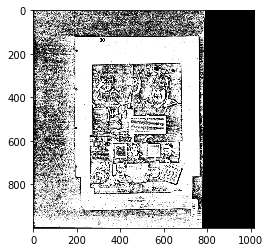

advertisement
/content/DocumentImages/train/advertisement/502100231+-0231.tif


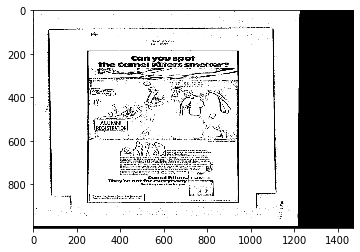

advertisement
/content/DocumentImages/train/advertisement/503944263+-4263.tif


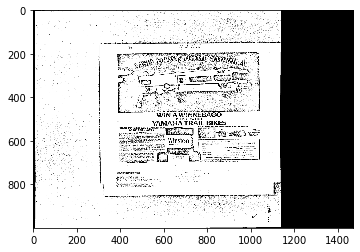

advertisement
/content/DocumentImages/train/advertisement/502610801+-0801.tif


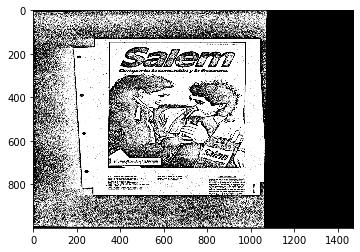

advertisement
/content/DocumentImages/train/advertisement/501947877.tif


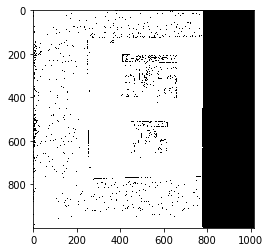

advertisement
/content/DocumentImages/train/advertisement/502100555+-0555.tif


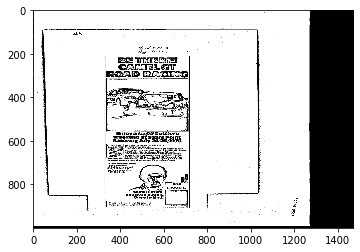

advertisement
/content/DocumentImages/train/advertisement/2061003175.tif


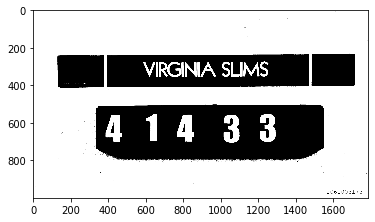

advertisement
/content/DocumentImages/train/advertisement/502218066.tif


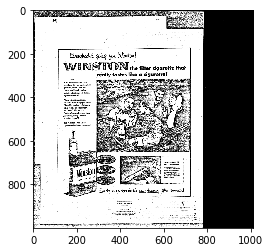

advertisement
/content/DocumentImages/train/advertisement/2061004551.tif


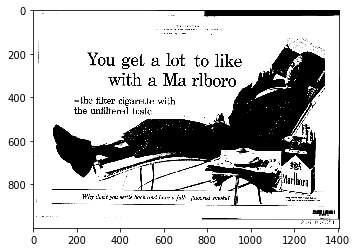

advertisement
/content/DocumentImages/train/advertisement/503961607+-1607.tif


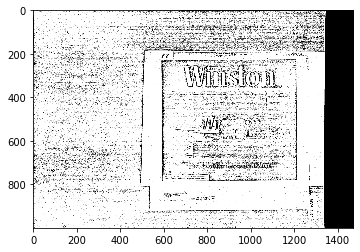

advertisement
/content/DocumentImages/train/advertisement/2061003310.tif


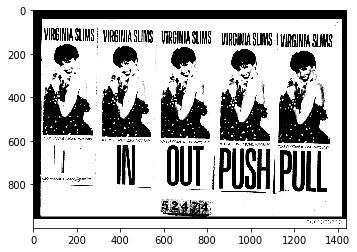

advertisement
/content/DocumentImages/train/advertisement/502610858+-0858.tif


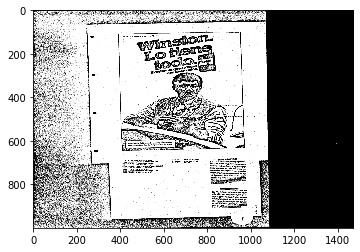

advertisement
/content/DocumentImages/train/advertisement/2061002602.tif


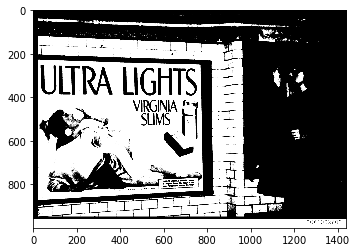

advertisement
/content/DocumentImages/train/advertisement/502607273+-7273.tif


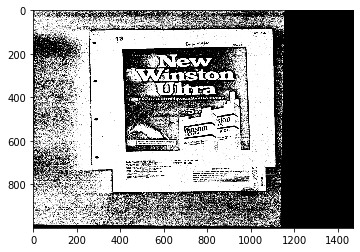

advertisement
/content/DocumentImages/train/advertisement/502100626+-0626.tif


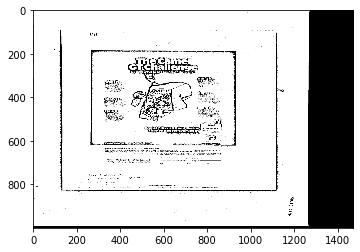

advertisement
/content/DocumentImages/train/advertisement/502100244+-0244.tif


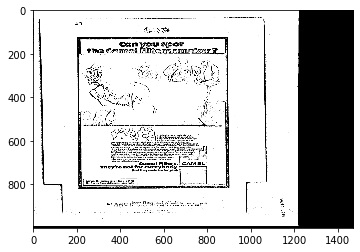

advertisement
/content/DocumentImages/train/advertisement/502607260+-7260.tif


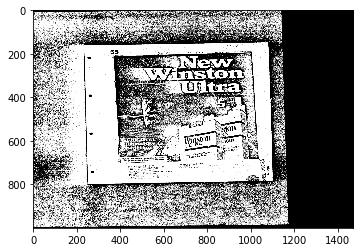

advertisement
/content/DocumentImages/train/advertisement/502610456+-0460.tif


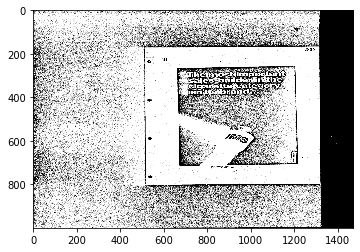

advertisement
/content/DocumentImages/train/advertisement/2061000249.tif


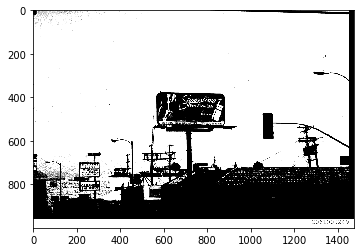

advertisement
/content/DocumentImages/train/advertisement/502607082+-7082.tif


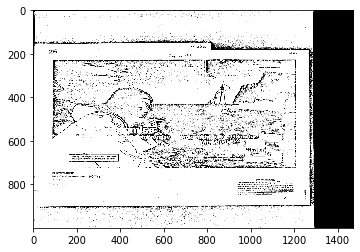

advertisement
/content/DocumentImages/train/advertisement/2061003319.tif


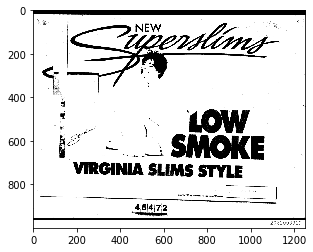

advertisement
/content/DocumentImages/train/advertisement/2061003179.tif


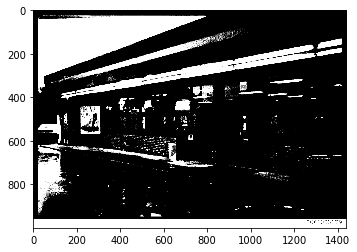

advertisement
/content/DocumentImages/train/advertisement/502100397+-0397.tif


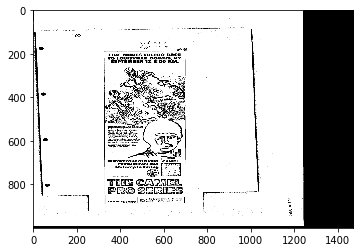

advertisement
/content/DocumentImages/train/advertisement/502607187+-7187.tif


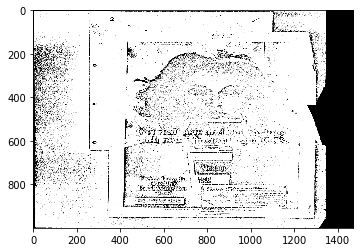

advertisement
/content/DocumentImages/train/advertisement/502605768+-5768.tif


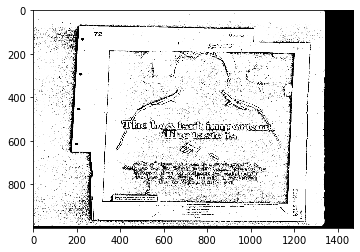

advertisement
/content/DocumentImages/train/advertisement/502610767+-0767.tif


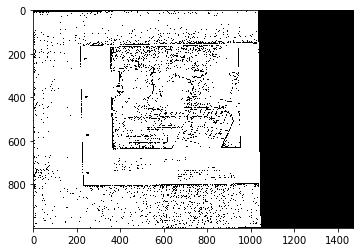

advertisement
/content/DocumentImages/train/advertisement/502610712+-0712.tif


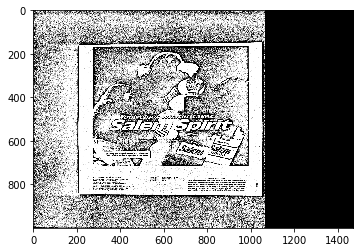

advertisement
/content/DocumentImages/train/advertisement/507806591.tif


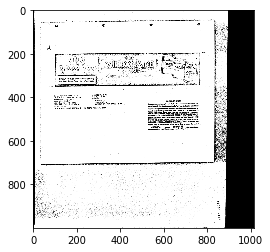

advertisement
/content/DocumentImages/train/advertisement/502218069.tif


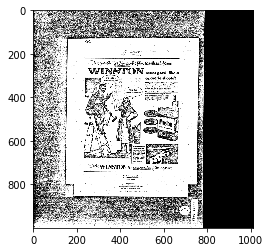

advertisement
/content/DocumentImages/train/advertisement/2061002395.tif


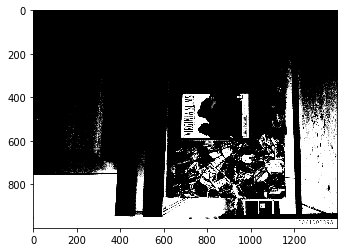

advertisement
/content/DocumentImages/train/advertisement/502100336+-0336.tif


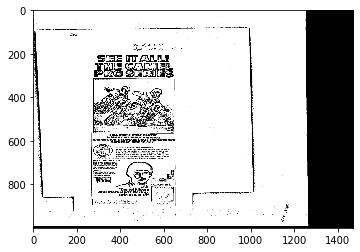

advertisement
/content/DocumentImages/train/advertisement/501947895.tif


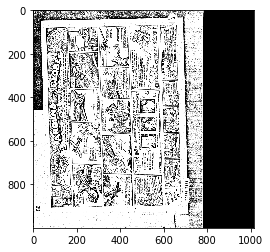

advertisement
/content/DocumentImages/train/advertisement/502606747+-6747.tif


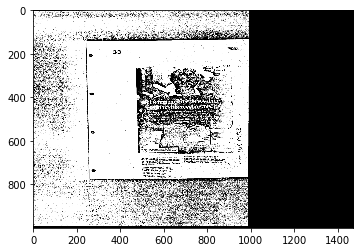

advertisement
/content/DocumentImages/train/advertisement/502100310+-0310.tif


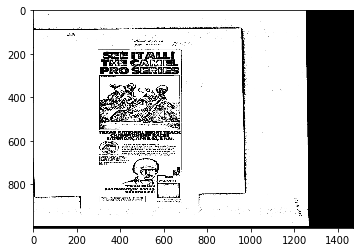

advertisement
/content/DocumentImages/train/advertisement/502100580+-0580.tif


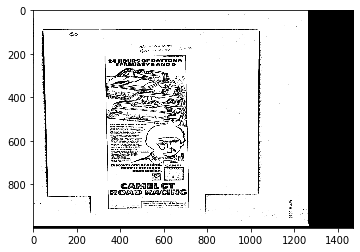

advertisement
/content/DocumentImages/train/advertisement/502610784+-0784.tif


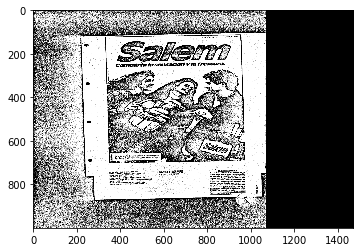

advertisement
/content/DocumentImages/train/advertisement/502606686+-6686.tif


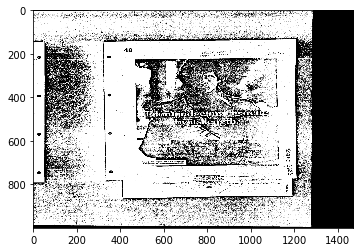

advertisement
/content/DocumentImages/train/advertisement/2061186481.tif


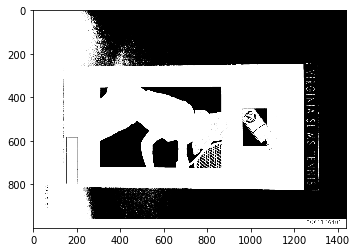

advertisement
/content/DocumentImages/train/advertisement/502100438+-0438.tif


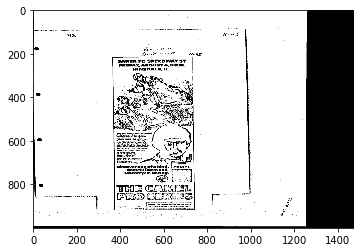

advertisement
/content/DocumentImages/train/advertisement/502100472+-0472.tif


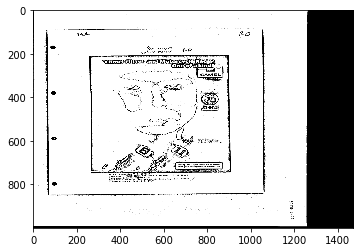

advertisement
/content/DocumentImages/train/advertisement/503944440+-4440.tif


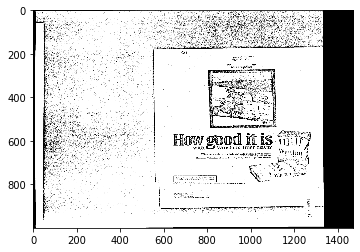

advertisement
/content/DocumentImages/train/advertisement/502474201.tif


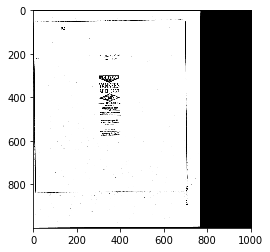

advertisement
/content/DocumentImages/train/advertisement/501949667.tif


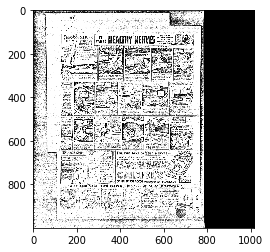

advertisement
/content/DocumentImages/train/advertisement/501947846.tif


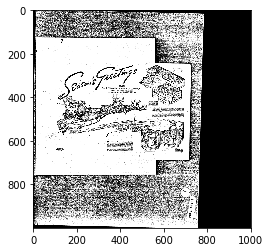

advertisement
/content/DocumentImages/train/advertisement/2061003315.tif


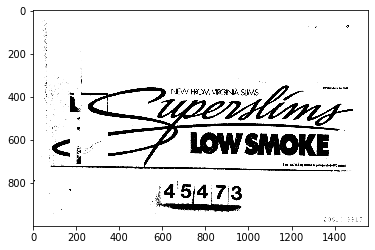

advertisement
/content/DocumentImages/train/advertisement/2061002461.tif


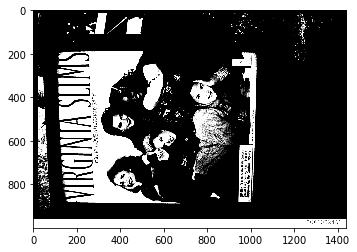

advertisement
/content/DocumentImages/train/advertisement/501947872.tif


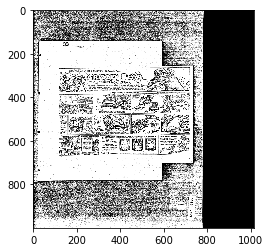

advertisement
/content/DocumentImages/train/advertisement/501949640.tif


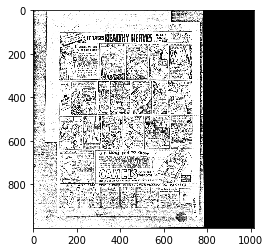

advertisement
/content/DocumentImages/train/advertisement/502610714+-0714.tif


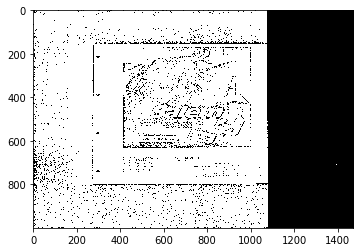

advertisement
/content/DocumentImages/train/advertisement/502610866+-0866.tif


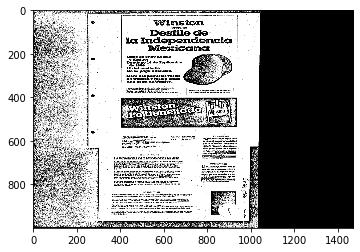

advertisement
/content/DocumentImages/train/advertisement/502606628+-6628.tif


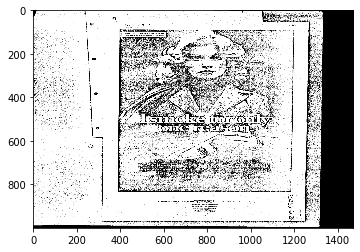

advertisement
/content/DocumentImages/train/advertisement/503961610+-1610.tif


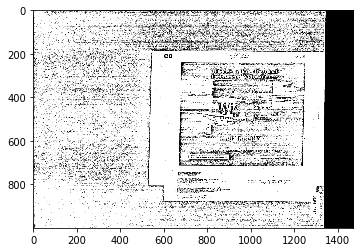

advertisement
/content/DocumentImages/train/advertisement/502605783+-5783.tif


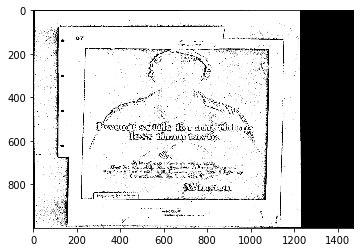

advertisement
/content/DocumentImages/train/advertisement/502606734+-6734.tif


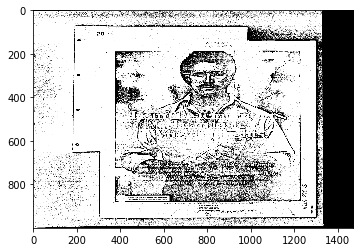

advertisement
/content/DocumentImages/train/advertisement/503961552+-1552.tif


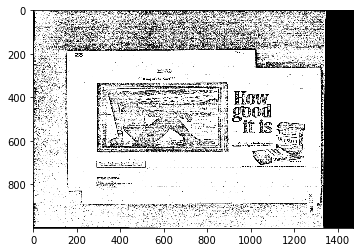

advertisement
/content/DocumentImages/train/advertisement/tob06520.84.tif


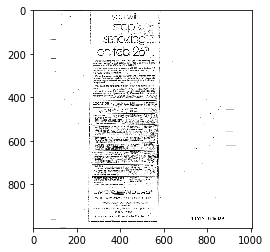

advertisement
/content/DocumentImages/train/advertisement/2040993101.tif


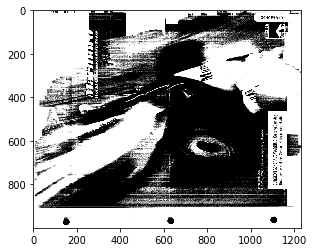

advertisement
/content/DocumentImages/train/advertisement/502100394+-0394.tif


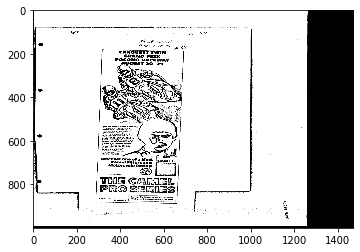

advertisement
/content/DocumentImages/train/advertisement/502610825+-0825.tif


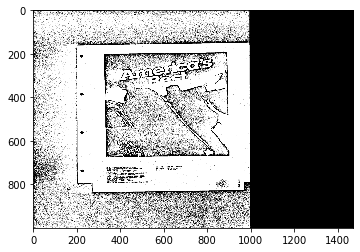

advertisement
/content/DocumentImages/train/advertisement/502100232+-0232.tif


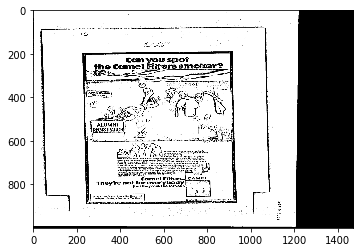

advertisement
/content/DocumentImages/train/advertisement/501947874.tif


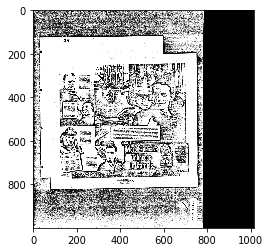

advertisement
/content/DocumentImages/train/advertisement/502610884+-0884.tif


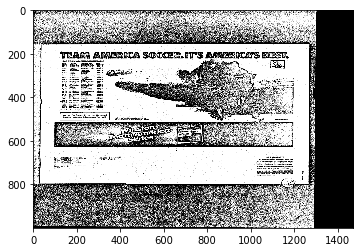

advertisement
/content/DocumentImages/train/advertisement/2061000284.tif


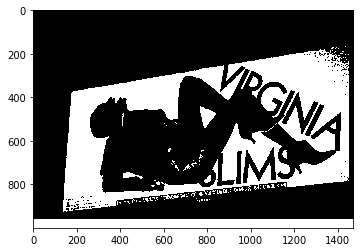

advertisement
/content/DocumentImages/train/advertisement/502607277+-7277.tif


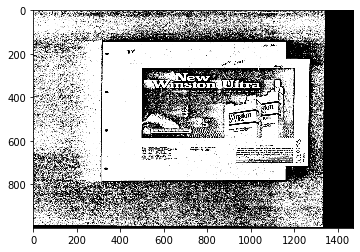

advertisement
/content/DocumentImages/train/advertisement/507806506.tif


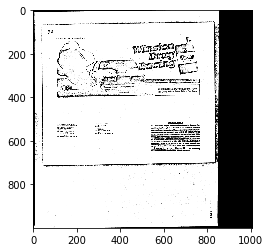

advertisement
/content/DocumentImages/train/advertisement/502605400+-5400.tif


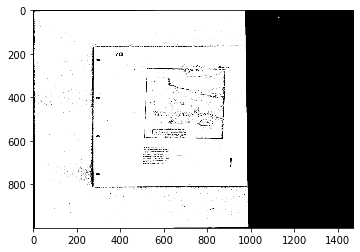

advertisement
/content/DocumentImages/train/advertisement/502610752+-0752.tif


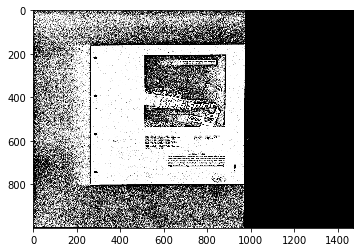

questionnaire
/content/DocumentImages/train/questionnaire/1002481794_1799.tif


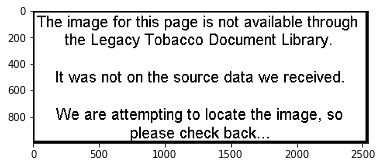

questionnaire
/content/DocumentImages/train/questionnaire/2058008535_2058008536.tif


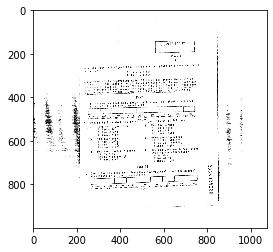

questionnaire
/content/DocumentImages/train/questionnaire/507781198+-1204.tif


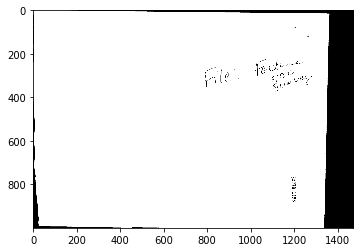

questionnaire
/content/DocumentImages/train/questionnaire/507543024_507543025.tif


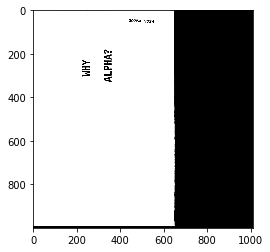

handwritten
/content/DocumentImages/train/handwritten/507706166.tif


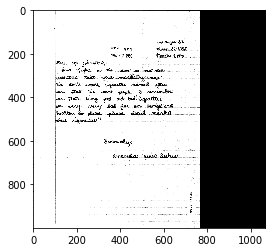

handwritten
/content/DocumentImages/train/handwritten/507707896_507707898.tif


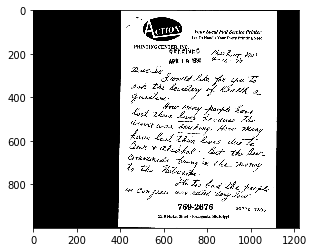

handwritten
/content/DocumentImages/train/handwritten/507703993_507703994.tif


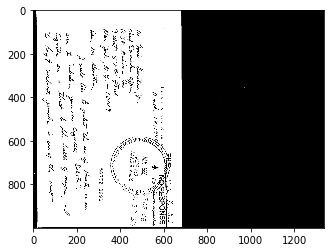

In [0]:
image_files = extract_file_paths("/content/DocumentImages/train")
#Get image dimensions
height = []
width = []
docs = []

for image in image_files:
    path = os.path.dirname(image)
    base = os.path.basename(path)
    docs.append(base)
    img = cv2.imread(image)
    height.append(img.shape[0])
    width.append(img.shape[1])
#Print images wider than taller
    if img.shape[1] > 1000:
        print(base)
        print(image)
        plt.imshow(img)
        plt.show()

In [0]:
image_dim = {"Document": docs, "Height": height, "Width": width}
image_dim_df = pd.DataFrame(image_dim, columns = ["Document", "Height", "Width"])

In [0]:
#Quantiles by class
image_dim_df.groupby('Document').quantile([0, 0.25, 0.5, 0.75, 1])

Height   Width
Document                          
advertisement 0.00  1000.0   596.0
              0.25  1000.0   754.0
              0.50  1000.0   757.0
              0.75  1000.0   777.0
              1.00  1000.0  3235.0
...                    ...     ...
specification 0.00  1000.0   611.0
              0.25  1000.0   754.0
              0.50  1000.0   775.0
              0.75  1000.0   784.0
              1.00  1000.0  1097.0

[80 rows x 2 columns]

312000


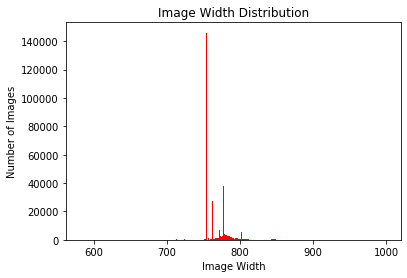

In [0]:
#Image Width Distribution
print(len(width))
width1 = [w for w in width if w <= 1000]
plt.hist(width, bins = range(min(width1), max(width1) + 1, 1), color = 'red')
plt.title('Image Width Distribution')
plt.xlabel('Image Width')
plt.ylabel('Number of Images')
plt.show()

In [0]:
#Getting mean pixel value of each image
pixel_means = []
for image in image_files:
    img = cv2.imread(image)
    pixel_mean = np.mean(np.array(img))
    pixel_means.append(pixel_mean)

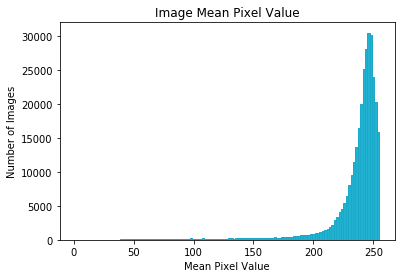

In [0]:
pixel_means_int = [int(x) for x in pixel_means]
plt.hist(pixel_means,bins = range(min(pixel_means_int),max(pixel_means_int) + 2, 2),color = '#21B1D1',edgecolor = '#1AA9C9')
plt.title('Image Mean Pixel Value')
plt.xlabel('Mean Pixel Value')
plt.ylabel('Number of Images')
plt.show()

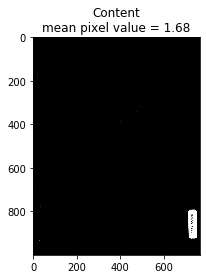

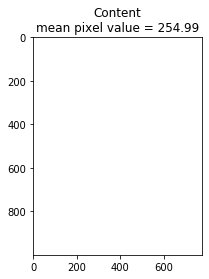

In [0]:
#Identifying the images with Highest (Whitest) mean pixel value and Lowest (Blackest) mean pixel value
max_index = pixel_means.index(max(pixel_means))
min_index = pixel_means.index(min(pixel_means))
max_image = image_files[max_index]
min_image = image_files[min_index]
max_img = cv2.imread(max_image, 0)
min_img = cv2.imread(min_image, 0)
max_path = os.path.dirname(max_image)
min_path = os.path.dirname(min_image)
max_doctype = max_path.split('/')[1]
min_doctype = min_path.split('/')[1]
plt.imshow(min_img, cmap = 'gray')
plt.title(min_doctype.title() + "\nmean pixel value = {}".format(min(pixel_means).round(2)))
plt.show()
plt.imshow(max_img, cmap = 'gray')
plt.title(max_doctype.title() + "\nmean pixel value = {}".format(max(pixel_means).round(2)))
plt.show()

In [0]:
#Creating images at half size of the previous for visual examination
full_image = cv2.imread('/content/DocumentImages/train/letter/00001807_00001809.tif', 0)
height, width = full_image.shape
print(full_image.shape)
cv2.imwrite('/content/Report/Images/fullimage.tif', full_image)
half_image = cv2.resize(full_image, (int(width/2), int(height/2)))
print(half_image.shape)
cv2.imwrite('/content/Report/Images/halfimage.tif', half_image)
quarter_image = cv2.resize(full_image, (int(width/4), int(height/4)))
print(quarter_image.shape)
cv2.imwrite('/content/Report/Images/quarterimage.tif', quarter_image)
eighth_image = cv2.resize(full_image, (int(width/8), int(height/8)))
print(eighth_image.shape)
cv2.imwrite('/content/Report/Images/eighthimage.tif', eighth_image)
sixteenth_image = cv2.resize(full_image, (int(width/16), int(height/16)))
print(sixteenth_image.shape)
cv2.imwrite('/content/Report/Images/sixteenthimage.tif', sixteenth_image)

In [0]:
random.seed(29)
def random_photo_per_class(path):
    random_images = []
    for root, dirs, files in os.walk(path):
        if root[-5:] != "train":
            image = random.choice(os.listdir("{}".format(root)))
            random_images.append(str(root)+os.sep+str(image))
    return random_images

random_photo_per_class('/content/DocumentImages/train//')

['/content/DocumentImages/train///form',
 '/content/DocumentImages/train//memo/2041794703.tif',
 '/content/DocumentImages/train//specification/2053453701.tif',
 '/content/DocumentImages/train//form/2026528544.tif',
 '/content/DocumentImages/train//file folder/2063071581.tif',
 '/content/DocumentImages/train//letter/0071035877.tif',
 '/content/DocumentImages/train//news article/2048785571_5575.tif',
 '/content/DocumentImages/train//budget/2040786789_2040786796.tif',
 '/content/DocumentImages/train//advertisement/502613194a-3195.tif',
 '/content/DocumentImages/train//presentation/0060240890.tif',
 '/content/DocumentImages/train//invoice/87149101_87149104.tif',
 '/content/DocumentImages/train//scientific publication/PUBLICATIONS030212-0.tif',
 '/content/DocumentImages/train//scientific report/87733690.tif',
 '/content/DocumentImages/train//handwritten/518220449+-0450.tif',
 '/content/DocumentImages/train//resume/50640305-0306.tif',
 '/content/DocumentImages/train//email/528806787+-6789.ti

In [0]:
examples = random_photo_per_class('/content/DocumentImages/train/')

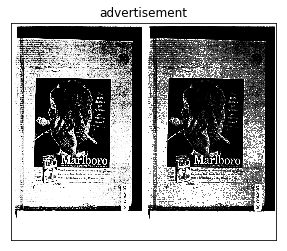

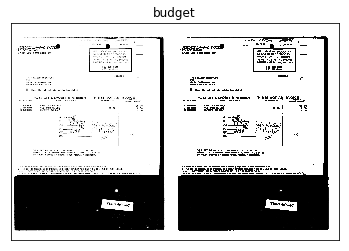

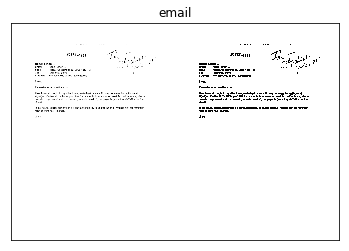

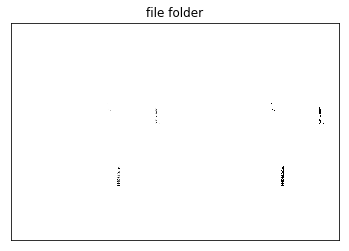

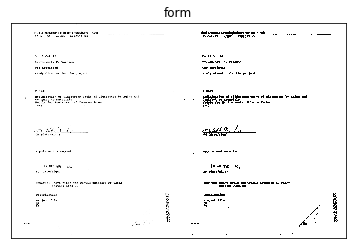

...

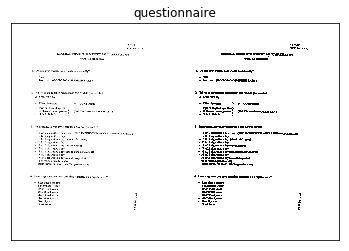

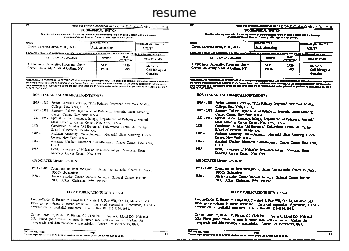

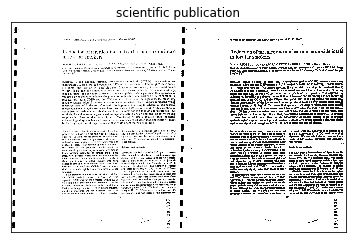

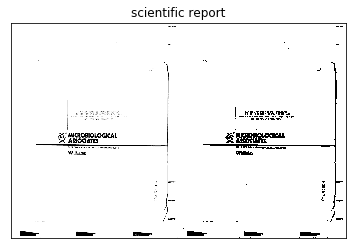

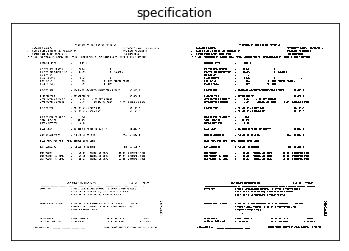

In [0]:
for image in examples:
    directory = os.path.dirname(image)
    doctype = directory.rsplit('\\', 1)[-1]
    img = cv2.imread(image, 0)

    equ = cv2.equalizeHist(img)
    res = np.hstack((img,equ))
    
    plt.subplot(111)
    plt.imshow(res, cmap='Greys_r')
    plt.title('{}'.format(doctype))
    plt.xticks([])
    plt.yticks([])
    plt.show()

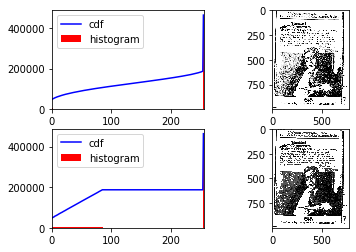

256
256


In [0]:
#https://github.com/jpcrum/Final_Project_Group5
#Histogram Equalization

img = cv2.imread('/content/DocumentImages/train/advertisement/00002210.tif',0)

#get histogram (count of each value) values and bin edges for all pixel values
hist,bins = np.histogram(img.flatten(),256,[0,256])

#cumulative sum to get cumulative distribution function
cdf = hist.cumsum()
#Normalize cdf by multiplying by most common pixel value divided by sum of pixel values
cdf_normalized = cdf * hist.max()/ cdf.max()


cdf_m = np.ma.masked_equal(cdf,0)
#min-max normalizing to [0,255] range
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')

img2 = cdf[img]

hist2,bins2 = np.histogram(img2.flatten(),256,[0,256])

cdf2 = hist2.cumsum()
cdf_normalized2 = cdf2 * hist2.max()/ cdf2.max()

plt.subplot(221)
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')

plt.subplot(222)
plt.imshow(img, cmap='Greys_r')

plt.subplot(223)
plt.plot(cdf_normalized2, color = 'b')
plt.hist(img2.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')

plt.subplot(224)
plt.imshow(img2, cmap='Greys_r')

plt.show()
print(len(cdf))
print(len(cdf_m))

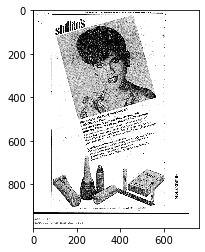

In [0]:
image = cv2.imread('/content/DocumentImages/test/advertisement/604659.tif', 0)
plt.imshow(image, cmap='gray')
plt.show()

Here we are Breaking the Images into 5 different Sub-categories like

    1.Header Images

    2.Footer Images

    3.Left Body Images
    
    4.Right Body images

    5.Whole Images (Header Images + Footer Images + Left Body Images + Right Body images)

![title](REGION_BASED_SPLITTING.png)

### Whole Model

In [0]:
#https://keras.io/preprocessing/image/
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

In [0]:
train_whole = train_datagen.flow_from_directory('/content/DocumentImages/train', batch_size=32, target_size=(256,256))
test_whole = test_datagen.flow_from_directory('/content/DocumentImages/test', batch_size=32, target_size=(256,256))
valid_whole = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=32, target_size=(256,256))

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
#https://keras.io/callbacks/
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.000001)
mcp_save = ModelCheckpoint('model_whole.hdf5', save_best_only=True, monitor='acc', mode='max')

In [0]:
model_whole = VGG16(weights = "imagenet", include_top = False, input_shape = (256, 256, 3))

In [0]:
for layer in model_whole.layers:
    layer.trainable=True

x = model_whole.output
x = Flatten()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(128, activation="relu")(x)
predictions = Dense(16, activation="softmax")(x)

model_whole_final = Model(input = model_whole.input, output = predictions)
 
model_whole_final.compile(loss = "categorical_crossentropy", optimizer=Adam(lr=0.0001), metrics=["accuracy"])

model_whole_final.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0   

In [0]:
tbCallBack = callbacks.TensorBoard(log_dir='./Graph', histogram_freq=0, write_graph=True, write_images=True)

In [0]:
history = model_whole_final.fit_generator(train_whole, steps_per_epoch = 312000/128, epochs=10, validation_data=valid_whole, validation_steps=36800/128, callbacks=[reduce_lr, mcp_save, tbCallBack])

Epoch 1/10
2438/2437 [==============================] - 767s 315ms/step - loss: 1.1941 - acc: 0.6427 - val_loss: 0.7395 - val_acc: 0.7772

Epoch 2/10
2438/2437 [==============================] - 766s 314ms/step - loss: 0.7662 - acc: 0.7774 - val_loss: 0.6474 - val_acc: 0.8082
Epoch 3/10
2438/2437 [==============================] - 765s 314ms/step - loss: 0.6616 - acc: 0.8078 - val_loss: 0.5324 - val_acc: 0.8421
Epoch 4/10
2438/2437 [==============================] - 768s 315ms/step - loss: 0.6039 - acc: 0.8248 - val_loss: 0.5005 - val_acc: 0.8538
Epoch 5/10
2438/2437 [==============================] - 757s 311ms/step - loss: 0.5170 - acc: 0.8486 - val_loss: 0.4802 - val_acc: 0.8582
Epoch 6/10
2438/2437 [==============================] - 765s 314ms/step - loss: 0.5088 - acc: 0.8516 - val_loss: 0.4507 - val_acc: 0.8657
Epoch 7/10
2438/2437 [==============================] - 765s 314ms/step - loss: 0.4833 - acc: 0.8592 - val_loss: 0.4295 - val_acc: 0.8737
Epoch 8/10
2438/2437 [===========

In [0]:
score = model_whole_final.evaluate_generator(test_whole,steps=36800/128,workers=2, use_multiprocessing=True, verbose=0)

In [0]:
print("The Accuracy for the whole image model:",score[1]*100,"%")

The Accuracy for the whole image model: 87.61935763888889 %


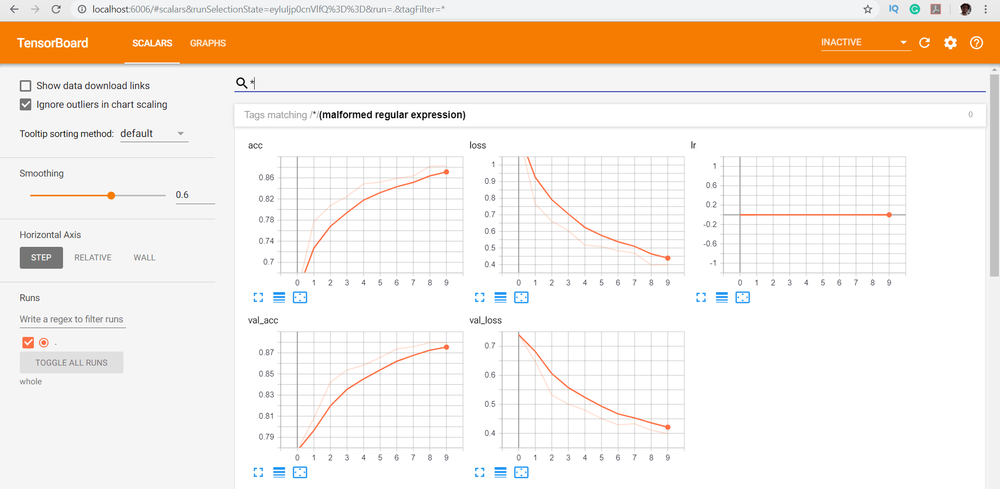

In [0]:
from IPython.display import Image
Image("tensorboard/whole_scalar graph.png")

### Header Image

In [0]:
model_header = VGG16(weights = "imagenet", include_top=False, input_shape = (256, 256, 3))

In [0]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.000001)
mcp_save = ModelCheckpoint('model_header.hdf5', save_best_only=True, monitor='acc', mode='max')

In [0]:
#https://github.com/samblshikhar/Document-Image-Classification-with-Intra-Domain-Transfer-Learning-and-Stacked-Generalization-of-Deep
for layer in model_header.layers:
    layer.trainable=True

x = model_header.output
x = Flatten()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(128, activation="relu")(x)
predictions = Dense(16, activation="softmax")(x)

model_header_final = Model(input = model_header.input, output = predictions)

model_header_final.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
model_header_final.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0   

In [0]:
model_header_final.load_weights('/content/drive/My Drive/model_whole.hdf5')

In [0]:
def height_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][:256,:,:]
        yield (batch_Xcrops,label)

In [0]:
#https://keras.io/preprocessing/image/
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

In [0]:
train_header = train_datagen.flow_from_directory('/content/DocumentImages/train',batch_size=32,target_size=(512,256))
test_header = test_datagen.flow_from_directory('/content/DocumentImages/test',batch_size=32,target_size=(512,256))
valid_header = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=32,target_size=(512,256))

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
tbCallBack = callbacks.TensorBoard(log_dir='./Graph', histogram_freq=0, write_graph=True, write_images=True)

In [0]:
history = model_header_final.fit_generator(height_crop_generator(train_header), steps_per_epoch =312000/256, epochs=10, validation_data=height_crop_generator(valid_header), validation_steps=36800/256, callbacks=[reduce_lr,mcp_save,tbCallBack])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




Epoch 1/10
1219/1218 [==============================] - 429s 352ms/step - loss: 0.8161 - acc: 0.7608 - val_loss: 0.6550 - val_acc: 0.8090

Epoch 2/10
1219/1218 [==============================] - 429s 352ms/step - loss: 0.6835 - acc: 0.8003 - val_loss: 0.5752 - val_acc: 0.8340
Epoch 3/10
1219/1218 [==============================] - 425s 349ms/step - loss: 0.6371 - acc: 0.8145 - val_loss: 0.5774 - val_acc: 0.8320
Epoch 4/10
1219/1218 [==============================] - 426s 349ms/step - loss: 0.6058 - acc: 0.8241 - val_loss: 0.5686 - val_acc: 0.8394
Epoch 5/10
1219/1218 [==============================] - 426s 349ms/step - loss: 0.5900 - acc: 0.8285 - val_loss: 0.4997 - val_acc: 0.8516
Epoch 6/10
1219/1218 [==============================] - 429s 352ms/step - loss: 0.5678 - acc: 0.8367 - val_loss: 0.5144 - val_acc: 0.8509
Epoch 7/10
1219/1218 [==============================] - 429s 352ms/step -

In [0]:
score = model_header_final.evaluate_generator(height_crop_generator(test_header),steps=36800/256,workers=2, use_multiprocessing=True, verbose=0)

In [0]:
print("The Accuracy for the header image model:",score[1]*100,"%")

The Accuracy for the header image model: 86.84895833333334 %


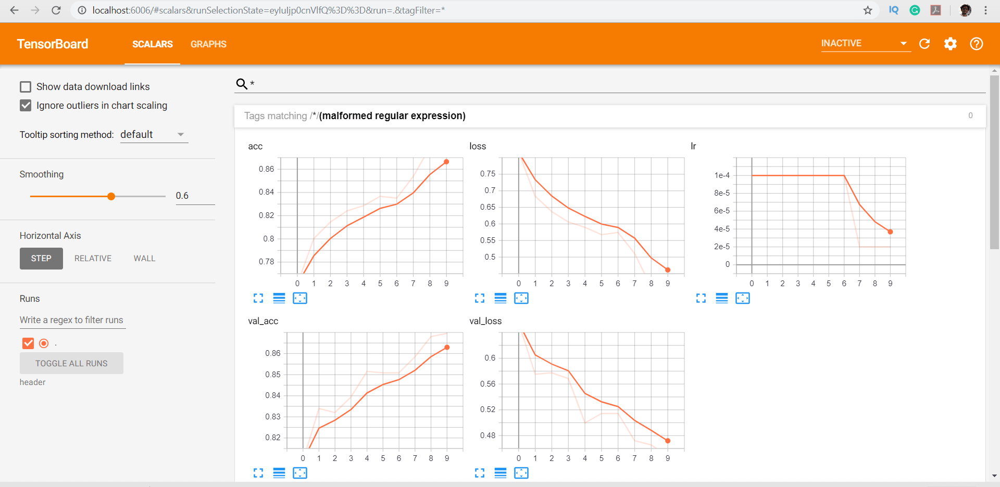

In [0]:
from IPython.display import Image
Image("tensorboard/header_scalar graph.png")

### Footer Image

In [0]:
model_footer = VGG16(weights = "imagenet", include_top=False, input_shape = (256, 256, 3))

In [0]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.000001)
mcp_save = ModelCheckpoint('model_footer.hdf5', save_best_only=True, monitor='acc', mode='max')

In [0]:
for layer in model_footer.layers:
    layer.trainable=True

x = model_footer.output
x = Flatten()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(128, activation="relu")(x)
predictions = Dense(16, activation="softmax")(x)

model_footer_final = Model(input = model_footer.input, output = predictions)

model_footer_final.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
model_footer_final.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0   

In [0]:
model_footer_final.load_weights('/content/drive/My Drive/model_whole.hdf5')

In [0]:
#https://github.com/sambalshikhar/Document-Image-Classification
def bottom_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][-256:,:,:]
        yield (batch_Xcrops,label)

In [0]:
#https://keras.io/preprocessing/image/
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

In [0]:
train_footer = train_datagen.flow_from_directory('/content/DocumentImages/train',batch_size=32,target_size=(512,256))
test_footer = test_datagen.flow_from_directory('/content/DocumentImages/test',batch_size=32,target_size=(512,256))
valid_footer = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=32,target_size=(512,256))

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
tbCallBack = callbacks.TensorBoard(log_dir='./Graph', histogram_freq=0, write_graph=True, write_images=True)

In [0]:
history = model_footer_final.fit_generator(bottom_crop_generator(train_footer), steps_per_epoch =312000/256, epochs=10, validation_data=bottom_crop_generator(valid_footer), validation_steps=36800/256, callbacks=[reduce_lr,mcp_save,tbCallBack])

Epoch 1/10
1219/1218 [==============================] - 411s 337ms/step - loss: 0.9550 - acc: 0.7121 - val_loss: 0.7584 - val_acc: 0.7700
Epoch 2/10
1219/1218 [==============================] - 415s 341ms/step - loss: 0.7914 - acc: 0.7604 - val_loss: 0.7036 - val_acc: 0.7815
Epoch 3/10
1219/1218 [==============================] - 426s 349ms/step - loss: 0.7458 - acc: 0.7786 - val_loss: 0.6748 - val_acc: 0.7945
Epoch 4/10
1219/1218 [==============================] - 431s 353ms/step - loss: 0.7155 - acc: 0.7866 - val_loss: 0.6537 - val_acc: 0.7967
Epoch 5/10
1219/1218 [==============================] - 433s 355ms/step - loss: 0.7005 - acc: 0.7923 - val_loss: 0.6340 - val_acc: 0.8049
Epoch 6/10
1219/1218 [==============================] - 430s 353ms/step - loss: 0.6775 - acc: 0.7991 - val_loss: 0.6398 - val_acc: 0.8064
Epoch 7/10
1219/1218 [==============================] - 456s 374ms/step - loss: 0.6669 - acc: 0.7985 - val_loss: 0.6176 - val_acc: 0.8149
Epoch 8/10
1219/1218 [============

In [0]:
score = model_footer_final.evaluate_generator(bottom_crop_generator(test_footer),steps=36800/128,workers=2, use_multiprocessing=True, verbose=0)

In [0]:
print("The Accuracy for the footer image model:",score[1]*100,"%")

The Accuracy for the footer image model: 82.13975694444444 %


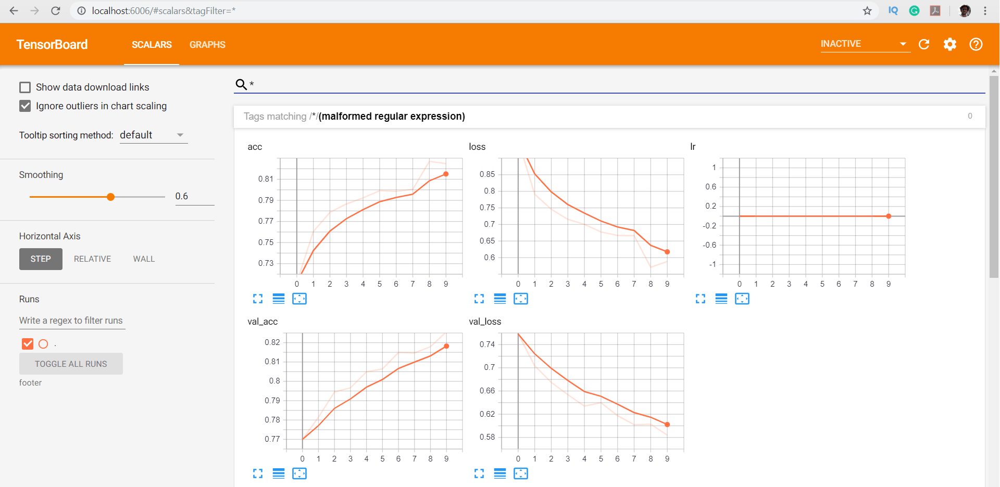

In [0]:
from IPython.display import Image
Image("tensorboard/footer_scalar graph.png")

### Left Body Image

In [0]:
model_left_body = VGG16(weights = "imagenet", include_top=False, input_shape = (256,256,3))

In [0]:
for layer in model_left_body.layers:
    layer.trainable=True

x = model_left_body.output
x = Flatten()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(128, activation="relu")(x)
predictions = Dense(16, activation="softmax")(x)

model_left_body_final = Model(input = model_left_body.input, output = predictions)

model_left_body_final.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.000001)
mcp_save = ModelCheckpoint('model_left_body.hdf5', save_best_only=True, monitor='acc', mode='max')

In [0]:
model_left_body_final.load_weights('/content/drive/My Drive/model_whole.hdf5')

In [0]:
def left_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][:,:256,:]
        yield (batch_Xcrops,label)

In [0]:
#https://keras.io/preprocessing/image/
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

In [0]:
train_left_body = train_datagen.flow_from_directory('/content/DocumentImages/train',batch_size=32,target_size=(256,512))
test_left_body = test_datagen.flow_from_directory('/content/DocumentImages/test',batch_size=32,target_size=(256,512))
valid_left_body = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=32,target_size=(256,512))

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
history = model_left_body_final.fit_generator(left_crop_generator(train_left_body), steps_per_epoch =312000/256, epochs=10, validation_data=left_crop_generator(valid_left_body), validation_steps=36800/256, callbacks=[reduce_lr,mcp_save,tbCallBack])

Epoch 1/10
1219/1218 [==============================] - 415s 340ms/step - loss: 0.8189 - acc: 0.7586 - val_loss: 0.6619 - val_acc: 0.8079
Epoch 2/10
1219/1218 [==============================] - 426s 349ms/step - loss: 0.6667 - acc: 0.8056 - val_loss: 0.6199 - val_acc: 0.8199
Epoch 3/10
1219/1218 [==============================] - 433s 355ms/step - loss: 0.6299 - acc: 0.8176 - val_loss: 0.5821 - val_acc: 0.8325
Epoch 4/10
1219/1218 [==============================] - 442s 363ms/step - loss: 0.6319 - acc: 0.8170 - val_loss: 0.5620 - val_acc: 0.8364
Epoch 5/10
1219/1218 [==============================] - 437s 358ms/step - loss: 0.5877 - acc: 0.8298 - val_loss: 0.5035 - val_acc: 0.8533
Epoch 6/10
1219/1218 [==============================] - 436s 358ms/step - loss: 0.5749 - acc: 0.8352 - val_loss: 0.5447 - val_acc: 0.8392
Epoch 7/10
1219/1218 [==============================] - 435s 357ms/step - loss: 0.5597 - acc: 0.8381 - val_loss: 0.5221 - val_acc: 0.8424
Epoch 8/10
1219/1218 [============

In [0]:
score = model_left_body_final.evaluate_generator(left_crop_generator(test_left_body),steps=36800/128,workers=2, use_multiprocessing=True, verbose=0)

In [0]:
print("The Accuracy for the left body image model:",score[1]*100,"%")

The Accuracy for the left body image model: 87.00086805555556 %


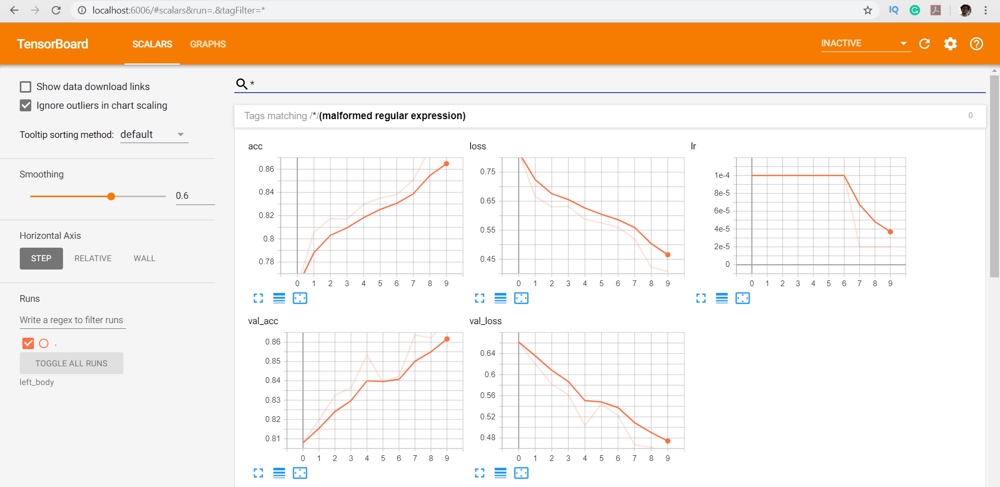

In [0]:
from IPython.display import Image
Image("tensorboard/left_body_scalar graph.png")

### Right Body Image

In [0]:
model_right_body = VGG16(weights = "imagenet", include_top=False, input_shape = (256,256,3))

In [0]:
for layer in model_right_body.layers:
    layer.trainable=True

x = model_right_body.output
x = Flatten()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(128, activation="relu")(x)
predictions = Dense(16, activation="softmax")(x)

model_right_body_final = Model(input = model_right_body.input, output = predictions)

model_right_body_final.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.000001)
mcp_save = ModelCheckpoint('model_right_body.hdf5', save_best_only=True, monitor='acc', mode='max')

In [0]:
model_right_body_final.load_weights('/content/drive/My Drive/model_whole.hdf5')

In [0]:
model_right_body_final.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0   

In [0]:
def right_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][:,-256:,:]
        yield (batch_Xcrops,label)

In [0]:
#https://keras.io/preprocessing/image/
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)

In [0]:
train_right_body = train_datagen.flow_from_directory('/content/DocumentImages/train',batch_size=32,target_size=(256,512))
test_right_body = test_datagen.flow_from_directory('/content/DocumentImages/test',batch_size=32,target_size=(256,512))
valid_right_body = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=32,target_size=(256,512))

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
history = model_right_body_final.fit_generator(right_crop_generator(train_right_body), steps_per_epoch =312000/256, epochs=10, validation_data=right_crop_generator(valid_right_body), validation_steps=36800/256, callbacks=[reduce_lr,mcp_save,tbCallBack])

Epoch 1/10
1219/1218 [==============================] - 414s 340ms/step - loss: 0.8891 - acc: 0.7305 - val_loss: 0.6971 - val_acc: 0.7906
Epoch 2/10
1219/1218 [==============================] - 424s 348ms/step - loss: 0.7244 - acc: 0.7807 - val_loss: 0.6168 - val_acc: 0.8155
Epoch 3/10
1219/1218 [==============================] - 429s 352ms/step - loss: 0.6769 - acc: 0.7985 - val_loss: 0.5938 - val_acc: 0.8194
Epoch 4/10
1219/1218 [==============================] - 433s 355ms/step - loss: 0.6480 - acc: 0.8053 - val_loss: 0.5995 - val_acc: 0.8160
Epoch 5/10
1219/1218 [==============================] - 431s 353ms/step - loss: 0.6317 - acc: 0.8132 - val_loss: 0.5513 - val_acc: 0.8331
Epoch 6/10
1219/1218 [==============================] - 436s 358ms/step - loss: 0.6165 - acc: 0.8156 - val_loss: 0.5531 - val_acc: 0.8314
Epoch 7/10
1219/1218 [==============================] - 451s 370ms/step - loss: 0.5851 - acc: 0.8232 - val_loss: 0.5451 - val_acc: 0.8381
Epoch 8/10
1219/1218 [============

In [0]:
score = model_right_body_final.evaluate_generator(right_crop_generator(test_right_body),steps=36800/128,workers=2, use_multiprocessing=True, verbose=0)

In [0]:
print("The Accuracy for the right body image model:",score[1]*100,"%")

The Accuracy for the right body image model: 85.17795138888889 %


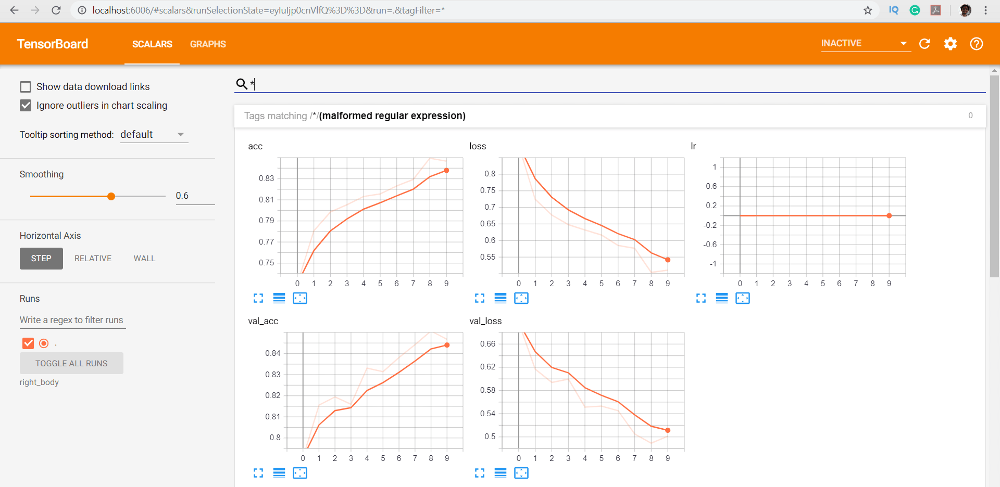

In [0]:
from IPython.display import Image
Image("tensorboard/right_body_scalar graph.png")

### Loading, Dumping and Stacking the Data

In [0]:
model_header_final.load_weights('/content/drive/My Drive/model_header.hdf5')
model_footer_final.load_weights('/content/drive/My Drive/model_footer.hdf5')
model_left_body_final.load_weights('/content/drive/My Drive/model_left_body.hdf5')
model_right_body_final.load_weights('/content/drive/My Drive/model_right_body.hdf5')

In [0]:
train_header_footer = train_datagen.flow_from_directory('/content/DocumentImages/train',batch_size=1,target_size=(512,256),shuffle=False)
test_header_footer = test_datagen.flow_from_directory('/content/DocumentImages/test',batch_size=1,target_size=(512,256),shuffle=False)
valid_header_footer = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=1,target_size=(512,256),shuffle=False)

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
train_header_footer.reset()
test_header_footer.reset()
valid_header_footer.reset()

In [0]:
feature_top = model_header_final.predict_generator(height_crop_generator(valid_header_footer),steps = 36800)

In [0]:
train_header_footer.reset()
test_header_footer.reset()
valid_header_footer.reset()

In [0]:
feature_bottom = model_footer_final.predict_generator(bottom_crop_generator(valid_header_footer),steps = 36800)

In [0]:
train_header_footer.reset()
test_header_footer.reset()
valid_header_footer.reset()

In [0]:
train_left_right.reset()
test_left_right.reset()
valid_left_right.reset()

In [0]:
train_left_right = train_datagen.flow_from_directory('/content/DocumentImages/train',batch_size=1,target_size=(256,512),shuffle=False)
test_left_right = test_datagen.flow_from_directory('/content/DocumentImages/test',batch_size=1,target_size=(256,512),shuffle=False)
valid_left_right = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=1,target_size=(256,512),shuffle=False)

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
train_left_right.reset()
test_left_right.reset()
valid_left_right.reset()

In [0]:
feature_left = model_left_body_final.predict_generator(left_crop_generator(valid_left_right),steps = 36800)

In [0]:
train_left_right.reset()
test_left_right.reset()
valid_left_right.reset()

In [0]:
feature_right = model_right_body_final.predict_generator(right_crop_generator(valid_left_right),steps = 36800)

In [0]:
train_left_right.reset()
test_left_right.reset()
valid_left_right.reset()

In [0]:
joblib.dump(feature_top,'top')
joblib.dump(feature_bottom,'bottom')
joblib.dump(feature_left,'left_body')
joblib.dump(feature_right,'right_body')

['right_body']

In [0]:
train_total.reset()
test_total.reset()
valid_total.reset()

In [0]:
train_total = train_datagen.flow_from_directory('/content/DocumentImages/train',batch_size=1,target_size=(256,256),shuffle=False)
test_total = test_datagen.flow_from_directory('/content/DocumentImages/test',batch_size=1,target_size=(256,256),shuffle=False)
valid_total = valid_datagen.flow_from_directory('/content/DocumentImages/valid', batch_size=1,target_size=(256,256),shuffle=False)

Found 312000 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.
Found 36800 images belonging to 16 classes.


In [0]:
train_total.reset()
test_total.reset()
valid_total.reset()

In [0]:
model_whole_final.load_weights('/content/drive/My Drive/model_whole.hdf5')

In [0]:
train_total.reset()
test_total.reset()
valid_total.reset()

In [0]:
holistic = model_whole_final.predict_generator(valid_total,steps = 36800)

In [0]:
train_total.reset()
test_total.reset()
valid_total.reset()

In [0]:
joblib.dump(holistic,'holistic')

['holistic']

In [0]:
top = joblib.load('/content/top')
bottom = joblib.load('/content/bottom')
left_body = joblib.load('/content/left_body')
right_body = joblib.load('/content/right_body')
holistic = joblib.load('/content/holistic')

In [0]:
total_features_valid = np.hstack((top, bottom, left_body, right_body, holistic))

In [0]:
total_features_valid.shape

(36800, 80)

In [0]:
train_total.reset()
test_total.reset()
valid_total.reset()

In [0]:
holistic_test = model_whole_final.predict_generator(test_total,steps = 36800)

In [0]:
train_total.reset()
test_total.reset()
valid_total.reset()

In [0]:
test_header_footer.reset()

In [0]:
top_test = model_header_final.predict_generator(height_crop_generator(test_header_footer),steps = 36800)

In [0]:
test_header_footer.reset()

In [0]:
bottom_test = model_footer_final.predict_generator(bottom_crop_generator(test_header_footer),steps = 36800)

In [0]:
test_header_footer.reset()

In [0]:
test_left_right.reset()

In [0]:
left_test = model_left_body_final.predict_generator(left_crop_generator(test_left_right),steps = 36800)

In [0]:
test_left_right.reset()

In [0]:
right_test = model_right_body_final.predict_generator(right_crop_generator(test_left_right),steps = 36800)

In [0]:
test_left_right.reset()

In [0]:
joblib.dump(holistic_test,'holistic_test')
joblib.dump(top_test,'top_test')
joblib.dump(bottom_test,'bottom_test')
joblib.dump(left_test,'left_body_test')
joblib.dump(right_test,'right_body_test')

['right_body_test']

In [0]:
header_test=joblib.load('/content/top_test')
footer_test=joblib.load('/content/bottom_test')
left_body_test=joblib.load('/content/left_body_test')
right_body_test=joblib.load('/content/right_body_test')
holistic_test=joblib.load('/content/holistic_test')

In [0]:
total_features_test=np.hstack((header_test, footer_test, left_body_test, right_body_test, holistic_test))

In [0]:
total_features_test.shape

(36800, 80)

In [0]:
train_total.reset()

In [0]:
holistic_train = model_whole_final.predict_generator(train_total,steps = 312000)
joblib.dump(holistic_train,'holistic_train')

['holistic_train']

In [0]:
train_total.reset()
train_header_footer.reset()

In [0]:
top_train = model_header_final.predict_generator(height_crop_generator(train_header_footer),steps = 312000)
joblib.dump(top_train,'top_train')

['top_train']

In [0]:
train_header_footer.reset()

In [0]:
bottom_train = model_footer_final.predict_generator(bottom_crop_generator(train_header_footer),steps = 312000)
joblib.dump(bottom_train,'bottom_train')

['bottom_train']

In [0]:
train_header_footer.reset()
train_left_right.reset()

In [0]:
left_body_train = model_left_body_final.predict_generator(left_crop_generator(train_left_right),steps = 312000)
joblib.dump(left_body_train,'left_train')

['left_train']

In [0]:
train_left_right.reset()

In [0]:
right_body_train = model_right_body_final.predict_generator(right_crop_generator(train_left_right),steps = 312000)
joblib.dump(right_body_train,'right_train')

['right_train']

In [0]:
train_left_right.reset()

In [0]:
holistic_train = model_whole_final.predict_generator(train_total,steps = 312000)
top_train = model_header_final.predict_generator(height_crop_generator(train_header_footer),steps = 312000)
bottom_train = model_footer_final.predict_generator(bottom_crop_generator(train_header_footer),steps = 312000)
left_body_train = model_left_body_final.predict_generator(left_crop_generator(train_left_right),steps = 312000)
right_body_train = model_right_body_final.predict_generator(right_crop_generator(train_left_right),steps = 312000)

In [0]:
joblib.dump(holistic_train,'holistic_train')
joblib.dump(top_train,'top_train')
joblib.dump(bottom_train,'bottom_train')
joblib.dump(left_body_train,'left_train')
joblib.dump(right_body_train,'right_train')

In [0]:
header_train = joblib.load('/content/top_train')
footer_train = joblib.load('/content/bottom_train')
left_body_train = joblib.load('/content/left_train')
right_body_train = joblib.load('/content/right_train')
holistic_train = joblib.load('/content/holistic_train')

In [0]:
total_features_train = np.hstack((header_train, footer_train, left_body_train, right_body_train, holistic_train))

In [0]:
total_features_train.shape

(312000, 80)

In [0]:
train_labels=[]
for i in range(312000):
    batch=next(train_total)
    train_labels.append(batch[1])

In [0]:
valid_labels=[]
for i in range(36800):
    batch=next(valid_total)
    valid_labels.append(batch[1])

In [0]:
test_labels=[]
for i in range(36800):
    batch=next(test_total)
    test_labels.append(batch[1])

In [0]:
joblib.dump(train_labels,'train_labels')
joblib.dump(valid_labels,'valid_labels')
joblib.dump(test_labels,'test_labels')

['test_labels']

In [0]:
train_labels = joblib.load('/content/train_labels')
valid_labels = joblib.load('/content/valid_labels')
test_labels = joblib.load('/content/test_labels')

### Final Model 

In [0]:
final_model = Sequential()
final_model.add(Dense(512, activation='relu', input_shape=(total_features_valid.shape[1],)))
final_model.add(Dropout(0.50))
final_model.add(BatchNormalization())
final_model.add(Dense(256, activation='relu'))
final_model.add(Dropout(0.50))
final_model.add(Dense(16, activation='softmax'))

In [0]:
tbCallBack = callbacks.TensorBoard(log_dir='./Graph', histogram_freq=0, write_graph=True, write_images=True)

In [0]:
final_model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
history = final_model.fit(total_features_train, train_labels , validation_data= (total_features_valid, valid_labels), batch_size = 64, epochs = 10, verbose=1, callbacks=[mcp_save, tbCallBack])

Train on 312000 samples, validate on 36800 samples
Epoch 1/10
312000/312000 [==============================] - 26s 84us/step - loss: 0.3736 - acc: 0.9092 - val_loss: 0.3621 - val_acc: 0.9053
Epoch 2/10
312000/312000 [==============================] - 25s 80us/step - loss: 0.3015 - acc: 0.9228 - val_loss: 0.3471 - val_acc: 0.9056
Epoch 3/10
312000/312000 [==============================] - 25s 80us/step - loss: 0.2888 - acc: 0.9237 - val_loss: 0.3388 - val_acc: 0.9061
Epoch 4/10
312000/312000 [==============================] - 25s 80us/step - loss: 0.2812 - acc: 0.9244 - val_loss: 0.3355 - val_acc: 0.9060
Epoch 5/10
312000/312000 [==============================] - 25s 80us/step - loss: 0.2762 - acc: 0.9249 - val_loss: 0.3321 - val_acc: 0.9070
Epoch 6/10
312000/312000 [==============================] - 25s 80us/step - loss: 0.2722 - acc: 0.9251 - val_loss: 0.3323 - val_acc: 0.9066
Epoch 7/10
312000/312000 [==============================] - 26s 82us/step - loss: 0.2697 - acc: 0.9256 - val_

In [0]:
score_test = final_model.evaluate(total_features_test, test_labels, batch_size=64)
print("Accuracy on the test data:",score_test[1]*100,'%')

36800/36800 [==============================] - 1s 23us/step
Accuracy on the test data: 90.6288043478261 %


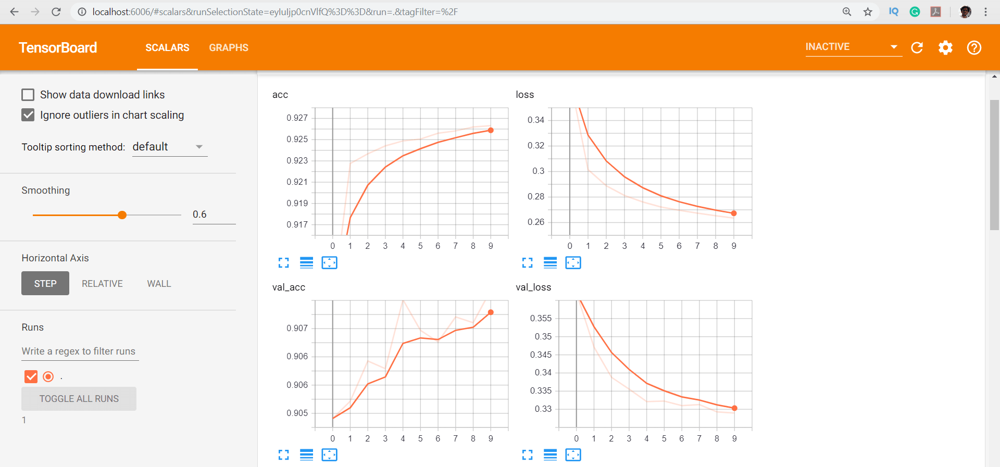

In [0]:
from IPython.display import Image
Image("tensorboard/final_scalar_graph.png")

### Testing

In [0]:
classes = ("advertisement", "budget", "email", "file folder", "form", "handwritten", "invoice", "letter", "memo", "news article", "presentation", "questionnaire", "resume", "scientific publication", "scientific report", "specification")

In [0]:
cmap = cm.get_cmap('gray')

def height_crop(path,type):
    image = cv2.imread(path)
    image = cv2.resize(image, (512, 256))
    if type =='bottom':
        image = image[-256:,:,:]
    else:
        image = image[:256,:,:]
    return image

def width_crop(path,type):
    image = cv2.imread(path)
    image = cv2.resize(image, (256, 512)) 
    if type == 'right':
        image = image[:,:256,:]
    else:
        image = image[:,-256:,:]
    return image

def full_image(path):
    image = cv2.imread(path)
    image = cv2.resize(image, (256, 256))
    return image

def preprocess(image):
    image = image/255
    image = np.expand_dims(image, axis=0)
    return image

In [0]:
img_path='0000176244.tif' #enter the image url/path you want to test
img = image.load_img(img_path, target_size = (256, 256))
x = image.img_to_array(img)
x = np.expand_dims(img,axis=0)
x = preprocess_input(x)

top_pred=model_header.predict(x)
bottom_pred=model_footer.predict(x)
left_pred=model_left_body.predict(x)
right_pred=model_right_body.predict(x)
holistic_pred=model_whole.predict(x)
total_features=np.hstack((top_pred,bottom_pred,left_pred,right_pred,holistic_pred))
prediction=final_model.predict(total_features)

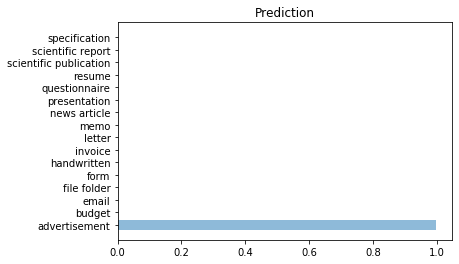

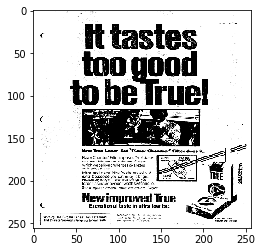

Predicted: [[9.9907327e-01 1.9776717e-05 2.0249520e-06 1.2867279e-04 6.7935318e-05
  6.3766885e-05 6.3295051e-06 1.6552991e-05 1.9140631e-05 2.6307214e-04
  4.5207056e-05 1.6421723e-04 9.8421024e-06 5.9455353e-05 4.5557317e-05
  1.5104232e-05]]


In [0]:
#For plotting the probabilities

y_pos = np.arange(len(classes))
score = prediction
score_up = np.ravel(score)
plt.barh(y_pos, score_up, align='center', alpha=0.5)
plt.yticks(y_pos, classes)
plt.title('Prediction')
plt.show()
plt.imshow(img)
plt.show()
print('Predicted:', score)

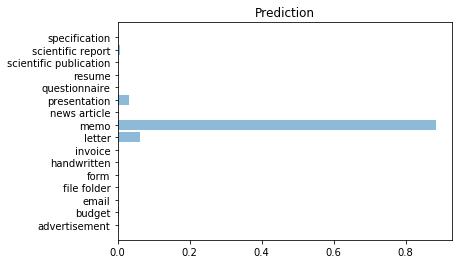

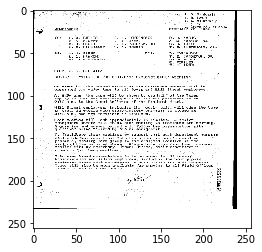

Predicted: [[8.1521028e-04 4.9587404e-03 1.5371690e-04 1.2334320e-03 1.7064442e-03
  6.7390800e-05 5.4901419e-04 6.1257679e-02 8.8570374e-01 1.8910767e-03
  3.0695038e-02 2.3587374e-03 1.0129750e-03 7.9793608e-05 7.0529990e-03
  4.6394055e-04]]


In [0]:
#For plotting the probabilities

y_pos = np.arange(len(classes))
score = prediction
score_up = np.ravel(score)
plt.barh(y_pos, score_up, align='center', alpha=0.5)
plt.yticks(y_pos, classes)
plt.title('Prediction')
plt.show()
plt.imshow(img)
plt.show()
print('Predicted:', score)

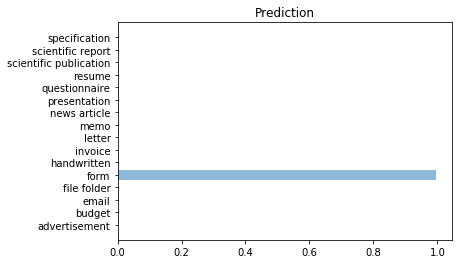

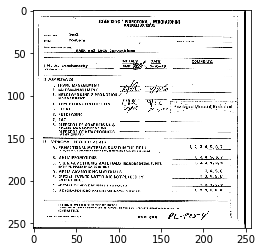

Predicted: [[5.2086009e-05 6.5495180e-05 3.0655590e-06 1.6898646e-05 9.9713111e-01
  4.6097877e-05 6.6983677e-04 2.4601378e-04 3.1958561e-04 6.7149808e-06
  1.5328365e-05 2.6096855e-04 9.3445287e-06 2.4760773e-06 7.4978423e-04
  4.0505306e-04]]


In [0]:
#For plotting the probabilities

y_pos = np.arange(len(classes))
score = final_model.predict(total_features)
score_up = np.ravel(score)
plt.barh(y_pos, score_up, align='center', alpha=0.5)
plt.yticks(y_pos, classes)
plt.title('Prediction')
plt.show()
plt.imshow(img)
plt.show()
print('Predicted:', score)

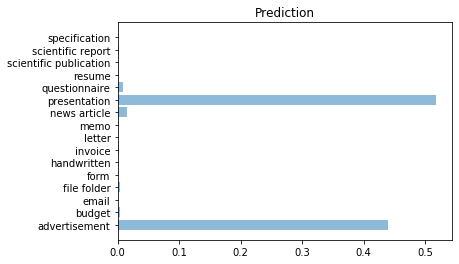

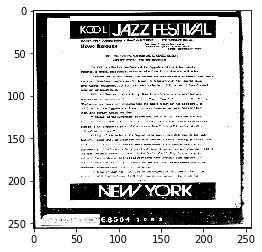

Predicted: [[4.3897784e-01 3.1364327e-03 9.6771670e-05 3.4926641e-03 1.3570576e-03
  1.0697749e-03 3.0701491e-03 9.6566317e-04 4.5748119e-04 1.4858071e-02
  5.1819396e-01 9.0237353e-03 1.4644145e-03 1.0137364e-03 2.1998514e-03
  6.2231440e-04]]


In [0]:
#For plotting the probabilities

y_pos = np.arange(len(classes))
score = final_model.predict(total_features)
score_up = np.ravel(score)
plt.barh(y_pos, score_up, align='center', alpha=0.5)
plt.yticks(y_pos, classes)
plt.title('Prediction')
plt.show()
plt.imshow(img)
plt.show()
print('Predicted:', score)

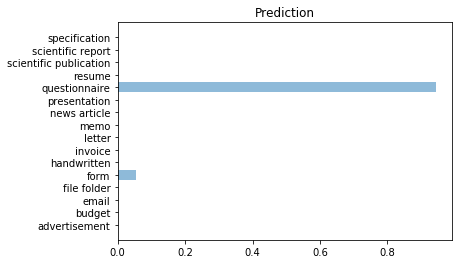

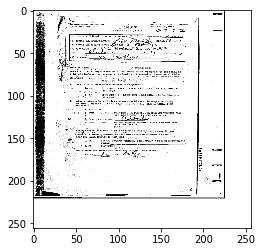

Predicted: [[1.00699166e-04 3.87446817e-05 1.77937329e-06 4.70001942e-05
  5.39738387e-02 3.34770826e-04 1.73669850e-05 4.02496953e-05
  2.99407566e-06 1.95080884e-06 9.31568211e-05 9.45190370e-01
  1.58458431e-06 5.17170565e-06 6.31634612e-05 8.70753356e-05]]


In [0]:
#For plotting the probabilities

y_pos = np.arange(len(classes))
score = final_model.predict(total_features)
score_up = np.ravel(score)
plt.barh(y_pos, score_up, align='center', alpha=0.5)
plt.yticks(y_pos, classes)
plt.title('Prediction')
plt.show()
plt.imshow(img)
plt.show()
print('Predicted:', score)

### Conclusion

1.In this Case Study we have to solve the Document Image Classification challenge. Here we took the RVL-CDIP Dataset.

2.Because the dataset is very big and needs GPU to computer so we use Google Colab for the free GPU. So, we download the data via curl and mounted the Colab Notebook with Google Drive.

3.After collecting the data we need to sort it because unlinke the other datasets RVL-CDIP dose not have different data from different folders. All the classes and the dats are jumble up. So we have to correctly separate the 16 classes.

4.The the next step is to read the data from the folders with help of labels (.txt files)

5.Now we will take the data and sort then inro Train, Test and Validation. The distribution is 312000 training images, 36800 testing images and 38600 validation images.

6.Then we will perfrom the Exploratory Data Analysis like Each section of data print, Quantilies by class, Image width distribution, Image mean pixel value, Image contrast etc.

7.After that we will be Creating images at half size of the previous for visual examination like (1000, 762), (500, 381), (250, 190), (125, 95), (62, 47)

8.Then we will print the Histogram Equalization.

9.The next task is to break the Images into different regions like Whole, Footer, Header, Right Body, Left Body for the optimum accuracy.

10.For every region there will be train validation and test sets.

11.Then we will perform VGG16 Netork on every region separately. After doing this we will record the accuracies.

12.After that we will stack the features and save the models. One of the most important step is to reset the generators otherwise the result will be incorrect.

13.Then we will calculate train labels, test labels and validation labels respectively.

14.Finally we will calculate the final training, testing and validation accuracies for the final model.

15.Then we will check the model accuracy by taking a testing image and our model should be able to tell the class in which the image should belong. If we can classify the images correctly then we can say that our model is working properly.